In [1]:
import sys
sys.path.append('../')
%load_ext autoreload
%autoreload 3

import xarray as xr
import matplotlib.pyplot as plt
from helpers.computational_tools import *
import xesmf as xe

from helpers.collection_of_experiments import CollectionOfExperiments

In [2]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))

In [15]:
import cartopy.feature as cfeature
def plot(x, cmap=cmocean.cm.balance,vmin=None,vmax=None, polar='False', label=None, land=False, gridlines=False, norm=None, central_longitude=0):
    plt.figure(figsize=(12, 5))
    #cmap.set_bad('gray')
    if polar != 'False':
        if polar == 'North':
            ax = plt.axes(projection=ccrs.NorthPolarStereo())
            ax.set_extent([-300,60,50,90],ccrs.PlateCarree())
        elif polar == 'South':
            ax = plt.axes(projection=ccrs.SouthPolarStereo())
            ax.set_extent([-300,60,-90,-40],ccrs.PlateCarree())
    else:
        ax = plt.axes(projection=ccrs.Robinson(central_longitude=central_longitude))
    try:
        (x).plot(ax=ax,x='lon', y='lat',robust=True, vmin=vmin, cmap=cmap, vmax=vmax, transform=ccrs.PlateCarree(), cbar_kwargs={'label':label}, norm=norm)
    except:
        (x).plot(ax=ax, robust=True, vmin=vmin, cmap=cmap, vmax=vmax, transform=ccrs.PlateCarree(), cbar_kwargs={'label':label}, norm=norm)
    if land:
        ax.add_feature(cfeature.LAND, color='gray', zorder=100)
    ax.coastlines(zorder=101)
    if gridlines:
        gl = ax.gridlines(draw_labels=True, linewidth=1,alpha=1.0, linestyle='-')

In [10]:
%%time
# Coarsen to coarse 1x1 grid
coords = xr.Dataset()
coords['lon'] = ds['ANN'].param.geolon
coords['lat'] = ds['ANN'].param.geolat
coords['lon_b'] = ds['ANN'].param.geolon_c.pad({'yq':(1,0)}, mode='symmetric').pad({'xq':(1,0)}, mode='wrap').drop_vars({'xq','yq'})
coords['lat_b'] = ds['ANN'].param.geolat_c.pad({'yq':(1,0)}, mode='symmetric').pad({'xq':(1,0)}, mode='wrap').drop_vars({'xq','yq'})

target_coords = xr.Dataset()
target_coords['lon'] = ds['ANN'].param.xh
target_coords['lat'] = ds['ANN'].param.yh

regridder_1x1 = xe.Regridder(coords, xe.util.grid_global(1, 1), "conservative", ignore_degenerate=True, periodic=True, unmapped_to_nan=True)
regridder_simple = xe.Regridder(coords, target_coords, "bilinear", ignore_degenerate=True, periodic=True, unmapped_to_nan=True)

CPU times: user 2min 31s, sys: 8.28 s, total: 2min 40s
Wall time: 2min 40s


In [3]:
energy_ann = xr.open_dataset('energy_ann.nc')
energy_ctrl = xr.open_dataset('energy_ctrl.nc')

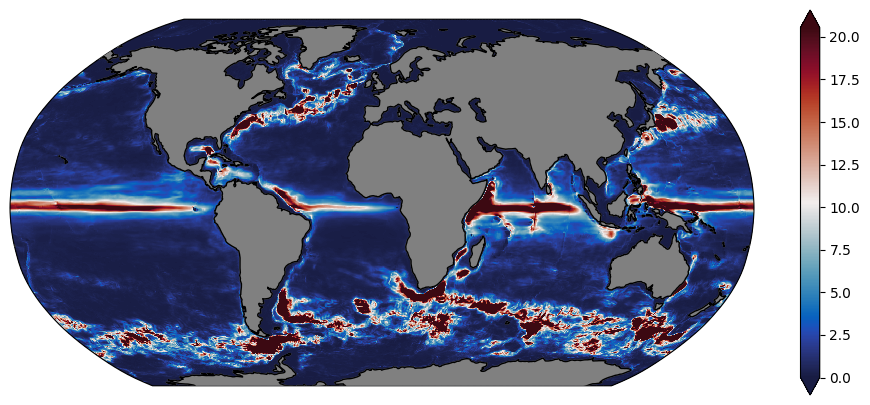

In [17]:
plot(energy_ctrl.EKE, land=True)

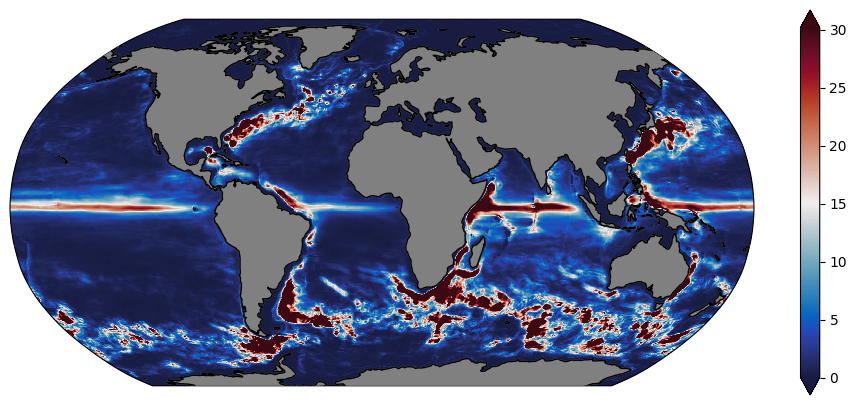

In [18]:
plot(energy_ann.EKE, land=True)

In [25]:
from dask.diagnostics import ProgressBar
with ProgressBar():
    %time ds['unparameterized'].ocean_daily_long

[########################################] | 100% Completed | 81.74 s
CPU times: user 3.41 s, sys: 458 ms, total: 3.87 s
Wall time: 1min 24s


In [33]:
with ProgressBar():
    %time ssh_std = ds['unparameterized'].ssh_std

[########################################] | 100% Completed | 11m 46s
CPU times: user 11min 28s, sys: 3min 45s, total: 15min 13s
Wall time: 11min 52s


In [39]:
with ProgressBar():
    %time ssh_std = ds['ANN'].ssh_std

[########################################] | 100% Completed | 86.57 s
[########################################] | 100% Completed | 7.13 ss
[########################################] | 100% Completed | 201.22 ms
[########################################] | 100% Completed | 10m 57s
CPU times: user 11min 43s, sys: 3min 19s, total: 15min 3s
Wall time: 12min 39s


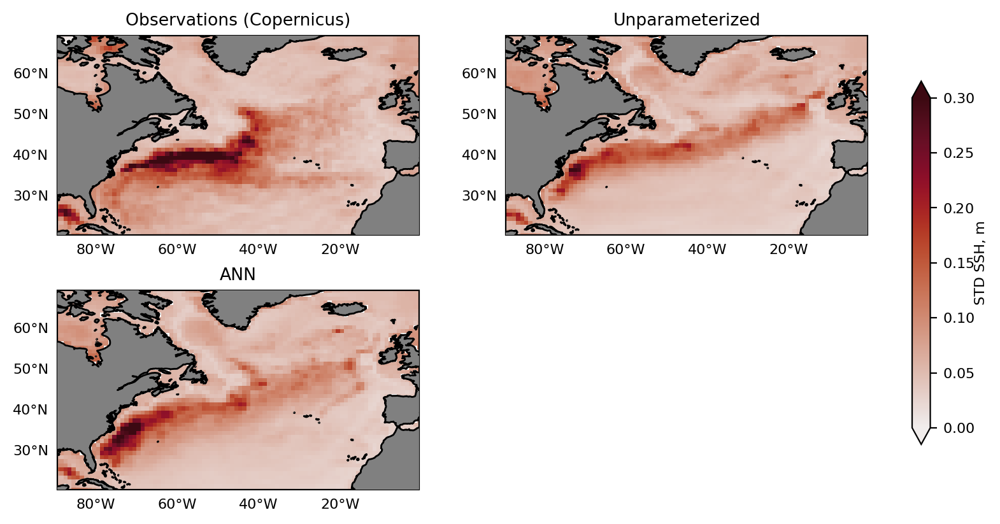

In [85]:
ds.plot_ssh_std(['obs', 'unparameterized', 'ANN'], select=select_NA_large, projection='2D', labels=['Observations (Copernicus)', 'Unparameterized', 'ANN'])
plt.savefig('presentation/ssh_std.pdf')

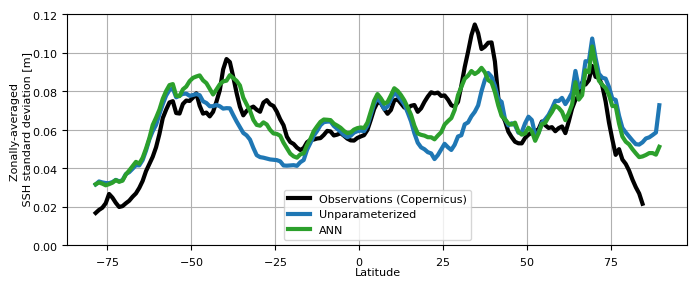

In [86]:
plt.figure(figsize=(8,3))
ds['ANN'].ssh_std_obs.mean('xh').plot(color='k', label='Observations (Copernicus)', lw=3)
ds['unparameterized'].ssh_std.mean('xh').plot(label='Unparameterized', lw=3, color='tab:blue')
ds['ANN'].ssh_std.mean('xh').plot(label='ANN', lw=3, color='tab:green')
plt.grid()
plt.legend()
plt.xlabel('Latitude')
plt.ylabel('Zonally-averaged \n SSH standard deviation [m]')
plt.ylim([0,0.12])
plt.savefig('presentation/ssh_std_lat.pdf')

# Glorys SSH data

In [117]:
glorys_zos = sort_longitude(xr.open_mfdataset('/vast/pp2681/GLORYS12v1/mercatorglorys12v1_gl12_mean_1993_2016_*.nc').zos.rename({'latitude':'yh', 'longitude':'xh'})).mean('time').compute()

In [125]:
glorys_zos_coarse = glorys_zos.interp(xh = ds['ANN'].ssh_mean_obs.xh, yh = ds['ANN'].ssh_mean_obs.yh).compute()

In [126]:
glorys_zos_coarse.to_netcdf('../data/ssh_mean_glorys.nc')

# Check accuracy

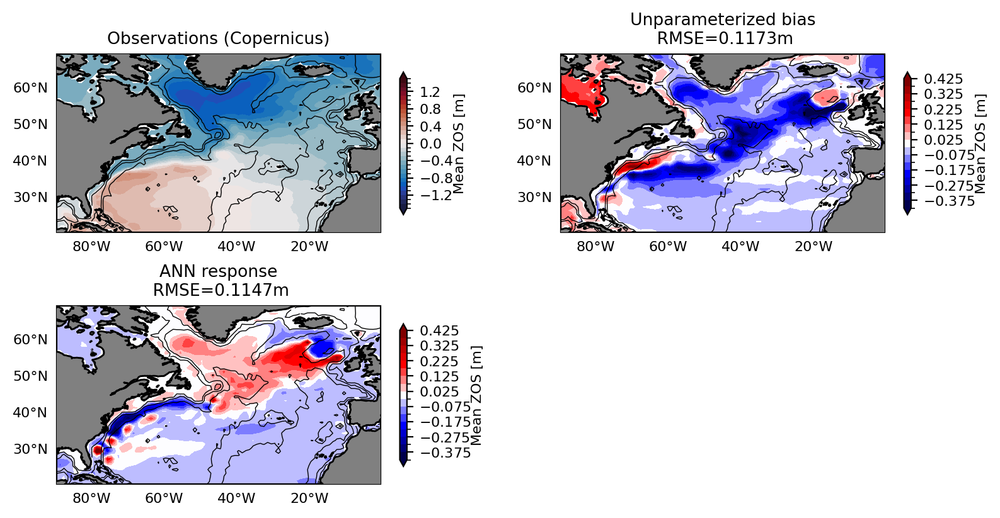

In [182]:
ds.plot_ssh_mean(['obs', 'unparameterized', 'ANN'], select=select_NA_large, plot_type='response', overlay_depth=True,
                labels=['Observations (Copernicus)', 'Unparameterized', 'ANN'])
plt.savefig('presentation/ssh_mean_NA.pdf')

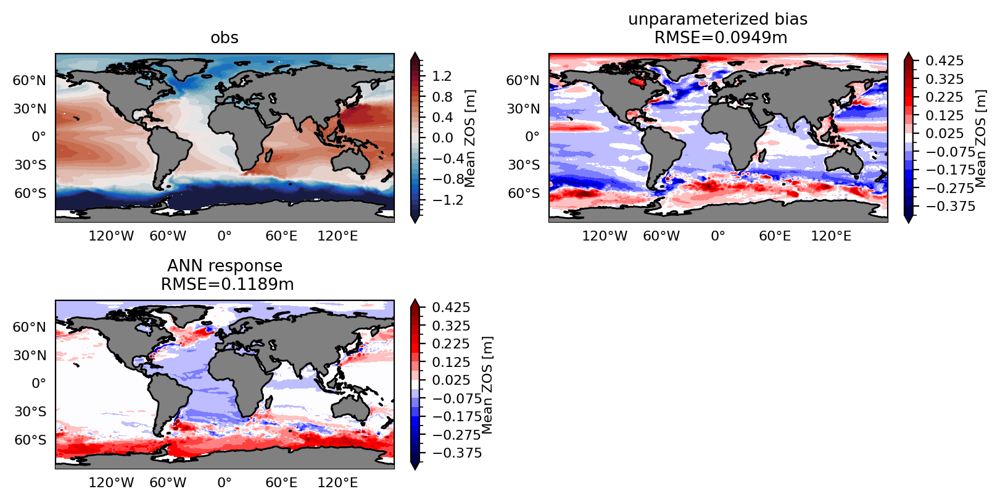

In [176]:
ds.plot_ssh_mean(['obs', 'unparameterized', 'ANN'], select=select_globe, plot_type='response', overlay_depth=False)

# How fast Gulf stream slow down? 

In [215]:
GS_ann = 1e-9 * ds['ANN'].ocean_annual_z.vmo.sel(zl=slice(0,2000)).sel(yq=26.5,method='nearest').sel(xh=slice(-80.5, -77)).sum(['xh','zl']).compute()

In [228]:
dx = ds['ANN'].param.dxCv
dy = ds['ANN'].param.dyCu
dz = ds['ANN'].dz
rho_ref_correction = 1.026 # Correction for approximate density near the surface where the most intence currents are
GS_ann_vo = rho_ref_correction * 1e-6 * (dx*dz*ds['ANN'].ocean_annual_z.vo).sel(zl=slice(0,2000)).sel(yq=26.5,method='nearest').sel(xh=slice(-80.5, -77)).sum(['xh','zl']).compute()

In [217]:
GS_ctrl_vo = rho_ref_correction * 1e-6 * (dx*dz*ds['unparameterized'].ocean_annual_z.vo).sel(zl=slice(0,2000)).sel(yq=26.5,method='nearest').sel(xh=slice(-80.5, -77)).sum(['xh','zl']).compute()

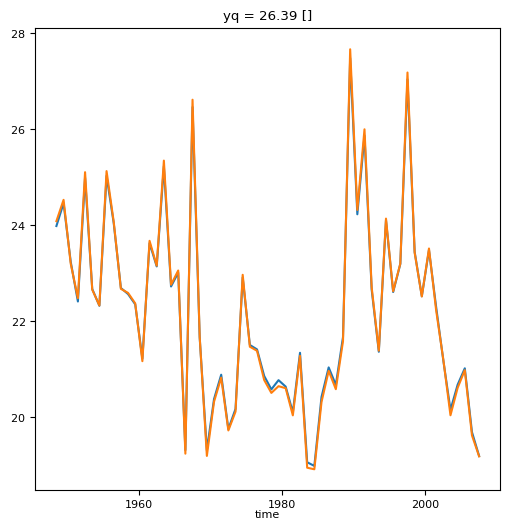

In [218]:
# Check accuracy of eulerian velocities
(GS_ann).plot()
(GS_ann_vo).plot()

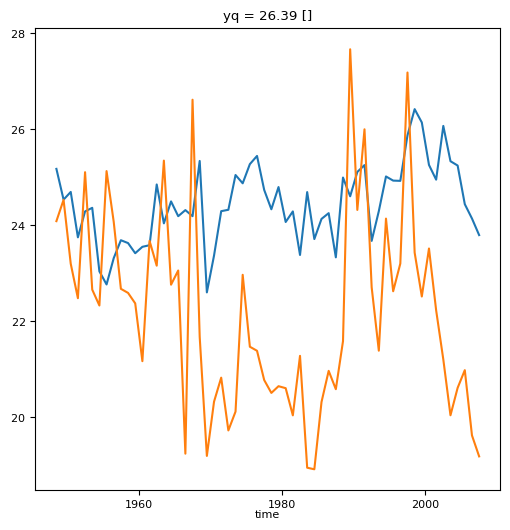

In [220]:
# Time series of Gulf Stream
# Seems that it is not simply a slow down but also increase of variability. Probably, because we have standing eddies where Gulf Stream forms
GS_ctrl_vo.plot()
GS_ann_vo.plot()

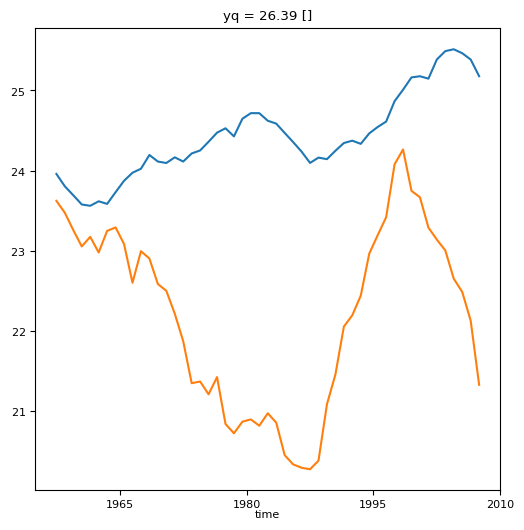

In [224]:
GS_ctrl_vo.rolling({'time':10}).mean().plot()
GS_ann_vo.rolling({'time':10}).mean().plot()

# Drake Transport

In [227]:
Drake_ann = 1e-9 * ds['ANN'].ocean_annual_z.umo.sel(xq=-70, method='nearest').sel(yh=slice(-71,-54.5)).sum(['yh','zl']).compute()

In [229]:
Drake_ann_uo = rho_ref_correction * 1e-6 * (dy*dz*ds['ANN'].ocean_annual_z.uo).sel(xq=-70, method='nearest').sel(yh=slice(-71,-54.5)).sum(['yh','zl']).compute()

In [233]:
Drake_ctrl_uo = rho_ref_correction * 1e-6 * (dy*dz*ds['unparameterized'].ocean_annual_z.uo).sel(xq=-70, method='nearest').sel(yh=slice(-71,-54.5)).sum(['yh','zl']).compute()

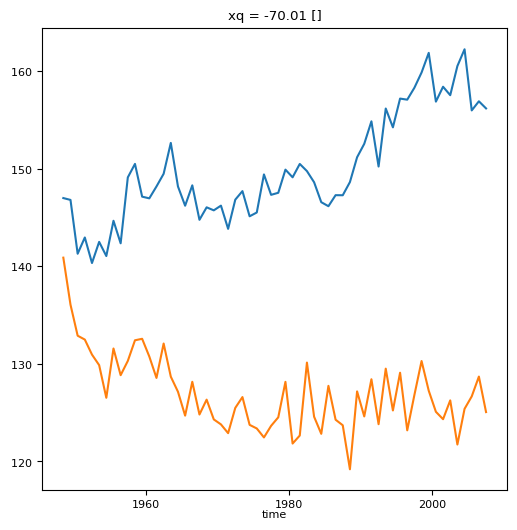

In [234]:
Drake_ctrl_uo.plot()
Drake_ann_uo.plot()
#Drake_ann.plot()

# NAC transport

In [11]:
#Mean flow of the western boundary current system at WOCE mooring line ACM-6 off Grand Banks, Newfoundland (42–43°N).
glorys = xr.open_mfdataset('/vast/pp2681/GLORYS12v1/mercatorglorys12v1_gl12_mean_1993_2016_*.nc').vo.sel(latitude=47,method='nearest').sel(longitude=slice(-45,-35)).mean('time').compute()
glorys_grid = xr.open_mfdataset('/vast/pp2681/GLORYS12v1/GLO-MFC_001_030_coordinates.nc').drop_vars(['depth','latitude','longitude'])

In [12]:
vo_ctrl = ds['unparameterized'].v_mean.sel(yq=47,method='nearest').sel(xh=slice(-45,-35)).compute()

In [13]:
vo_ann = ds['ANN'].v_mean.sel(yq=47,method='nearest').sel(xh=slice(-45,-35)).compute()

Text(0.5, 1.0, 'ANN')

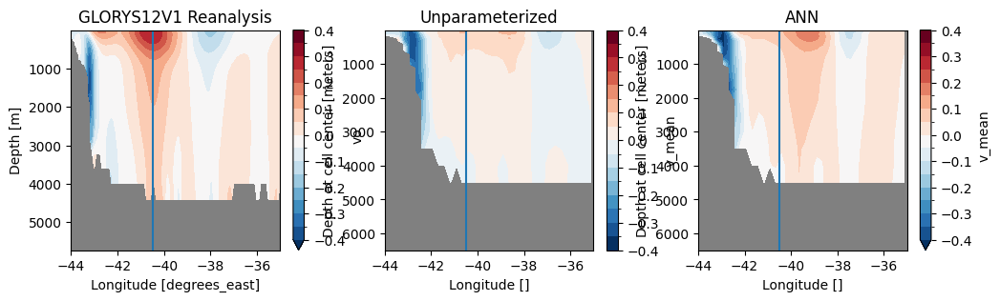

In [42]:
plt.figure(figsize=(12,3))

plt.subplot(1,3,1)
glorys.plot.contourf(levels=np.arange(-0.4,0.45,0.05))
plt.gca().set_facecolor('gray')
plt.gca().invert_yaxis()
plt.xlim([-44,-35])
plt.axvline(x=-40.5)
plt.title('GLORYS12V1 Reanalysis')

plt.subplot(1,3,2)
vo_ctrl.plot.contourf(levels=np.arange(-0.4,0.45,0.05))
plt.gca().set_facecolor('gray')
plt.gca().invert_yaxis()
plt.axvline(x=-40.5)
plt.axvline(x=-49)
plt.axvline(x=-47)
plt.axvline(x=-45)
plt.xlim([-44,-35])
plt.title('Unparameterized')

plt.subplot(1,3,3)
vo_ann.plot.contourf(levels=np.arange(-0.4,0.45,0.05))
plt.gca().set_facecolor('gray')
plt.gca().invert_yaxis()
plt.axvline(x=-40.5)
plt.axvline(x=-49)
plt.axvline(x=-47)
plt.axvline(x=-45)
plt.xlim([-44,-35])
plt.title('ANN')

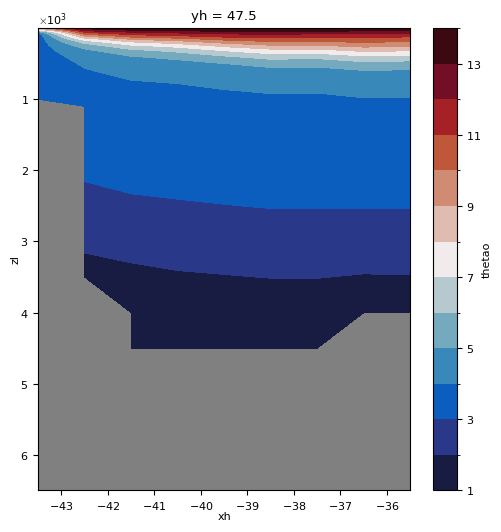

In [63]:
ds['ANN'].thetao.sel(time=slice('1981','2007')).mean('time').sel(xh=slice(-44,-35)).sel(yh=47, method='nearest').plot.contourf(cmap=cmocean.cm.balance, levels=15)
plt.gca().set_facecolor('gray')
plt.gca().invert_yaxis()

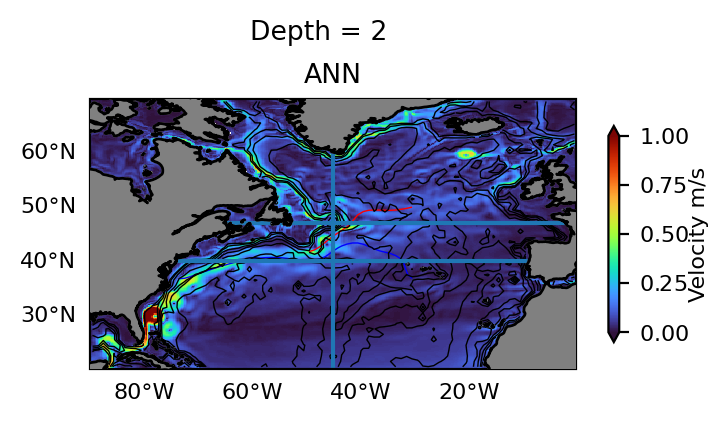

In [65]:
ds.plot_uabs(['ANN'], select=select_NA_large, overlay_depth=True, GS_NAC=True)
plt.axvline(x=-45)
plt.axhline(y=40)
plt.axhline(y=47)

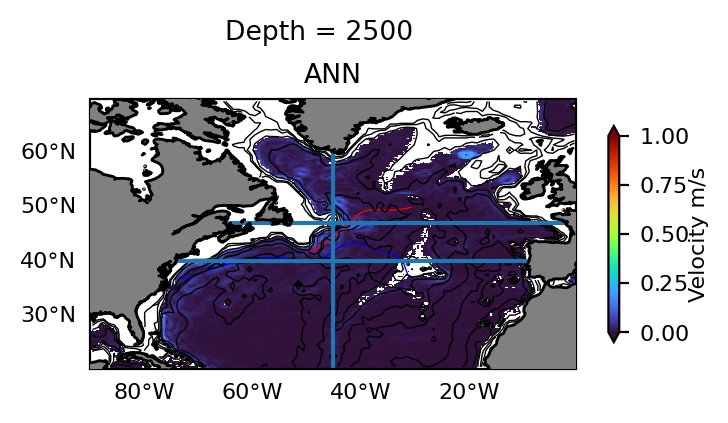

In [69]:
ds.plot_uabs(['ANN'], select=select_NA_large, overlay_depth=True, GS_NAC=True, zl=26)
plt.axvline(x=-45)
plt.axhline(y=40)
plt.axhline(y=47)

In [410]:
exp = 'unparameterized'
DWBC_ctrl = rho_ref_correction * 1e-6 * np.minimum((ds[exp].ocean_annual_z.vo * dx * dz).sel(xh=slice(-49,-45)).sel(yq=43, method='nearest'),0.).sum(['xh','zl']).compute()
NAC_ctrl = rho_ref_correction * 1e-6 * np.maximum((ds[exp].ocean_annual_z.vo * dx * dz).sel(xh=slice(-49,-45)).sel(yq=43, method='nearest'),0.).sum(['xh','zl']).compute()

In [411]:
exp = 'ANN'
DWBC_ann = rho_ref_correction * 1e-6 * np.minimum((ds[exp].ocean_annual_z.vo * dx * dz).sel(xh=slice(-49,-45)).sel(yq=43, method='nearest'),0.).sum(['xh','zl']).compute()
NAC_ann = rho_ref_correction * 1e-6 * np.maximum((ds[exp].ocean_annual_z.vo * dx * dz).sel(xh=slice(-49,-45)).sel(yq=43, method='nearest'),0.).sum(['xh','zl']).compute()

(0.0, 60.0)

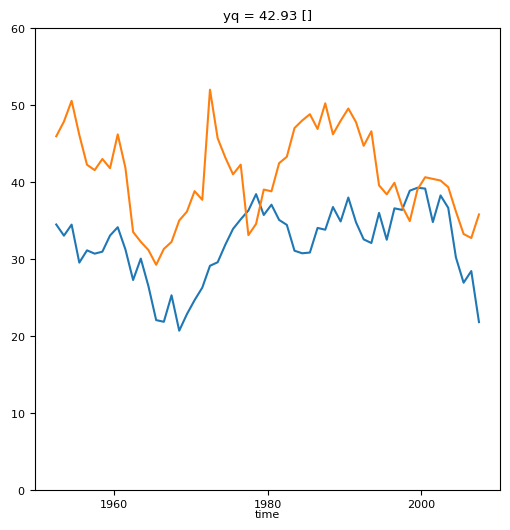

In [430]:
NAC_ctrl.rolling({'time':5}).mean().plot()
NAC_ann.rolling({'time':5}).mean().plot()
plt.ylim([0,60])

(-60.0, 0.0)

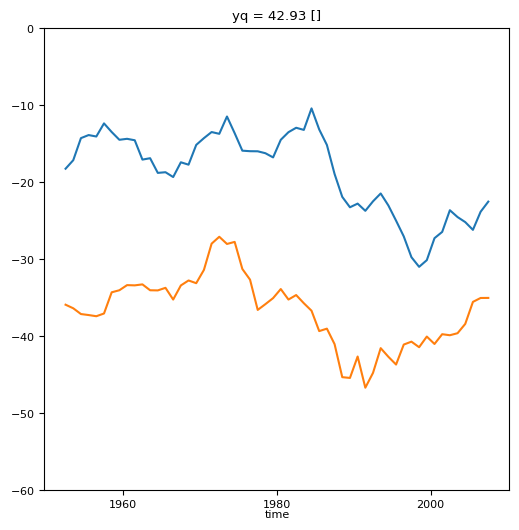

In [431]:
DWBC_ctrl.rolling({'time':5}).mean().plot()
DWBC_ann.rolling({'time':5}).mean().plot()
plt.ylim([-60,0])

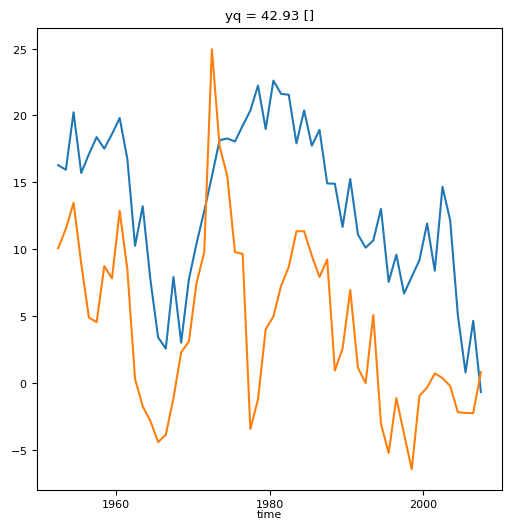

In [432]:
(DWBC_ctrl+NAC_ctrl).rolling({'time':5}).mean().plot()
(DWBC_ann+NAC_ann).rolling({'time':5}).mean().plot()

# Transport time series in North Atlantic and Southern Ocean

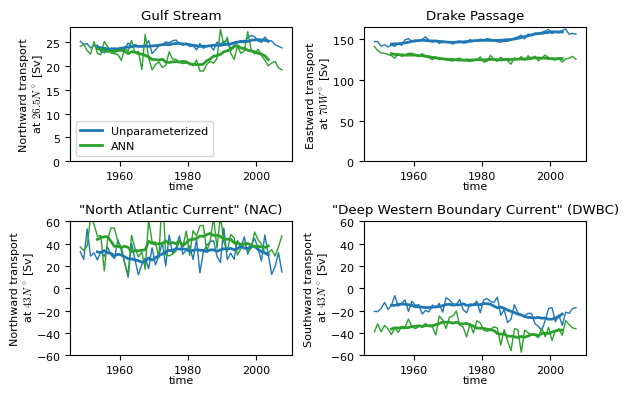

In [472]:
plt.figure(figsize=(6,4))
ave = lambda x: x.rolling({'time':10}, center=True).mean()
plt.subplot(2,2,1)
GS_ctrl_vo.plot(lw=1, color='tab:blue')
GS_ann_vo.plot(lw=1, color='tab:green')
ave(GS_ctrl_vo).plot(lw=2, label='Unparameterized')
ave(GS_ann_vo).plot(lw=2,color='tab:green', label='ANN')
plt.ylabel('Northward transport\n at $26.5N^\circ$ [Sv]')
plt.ylim([0,None])
plt.title('Gulf Stream')
plt.legend()

plt.subplot(2,2,2)
Drake_ctrl_uo.plot(lw=1, color='tab:blue')
Drake_ann_uo.plot(lw=1, color='tab:green')
ave(Drake_ctrl_uo).plot(lw=2, label='Unparameterized')
ave(Drake_ann_uo).plot(lw=2,color='tab:green', label='ANN')
plt.ylabel('Eastward transport\n at $70W^\circ$ [Sv]')
plt.ylim([0,None])
plt.title('Drake Passage')

plt.subplot(2,2,3)
NAC_ctrl.plot(lw=1, color='tab:blue')
NAC_ann.plot(lw=1, color='tab:green')
ave(NAC_ctrl).plot(lw=2, label='Unparameterized')
ave(NAC_ann).plot(lw=2,color='tab:green', label='ANN')
plt.ylabel('Northward transport\n at $43N^\circ$ [Sv]')
plt.ylim([-60,60])
plt.title('"North Atlantic Current" (NAC)')

plt.subplot(2,2,4)
DWBC_ctrl.plot(lw=1, color='tab:blue')
DWBC_ann.plot(lw=1, color='tab:green')
ave(DWBC_ctrl).plot(lw=2, label='Unparameterized')
ave(DWBC_ann).plot(lw=2,color='tab:green', label='ANN')
plt.ylabel('Southward transport\n at $43N^\circ$ [Sv]')
plt.ylim([-60,60])
plt.title('"Deep Western Boundary Current" (DWBC)')

plt.tight_layout()

plt.savefig('presentation/transports.pdf')

# Estimation of the heat flux
Following Perezhogin 2019, we compute meridional heat transport as follows (https://epubs.siam.org/doi/pdf/10.1137/140990048):
$$
Q = \rho_0 C_p \theta v
$$
where $\rho_0=1035 kg/m^3$ and $C_p=3992 J K^{-1} kg^{-1}$

In [64]:
from helpers.computational_tools import create_grid_global
param = ds['ANN'].param
grid = create_grid_global(param)
rho0 = 1035
Cp = 3992

In [4]:
from dask.diagnostics import ProgressBar
exp = ds['unparameterized']
e = exp.ocean3d.e
h = (e.isel(zi=slice(0,-1)).drop_vars('zi') - e.isel(zi=slice(1,None)).drop_vars('zi')).rename({'zi': 'zl'})
with ProgressBar():
    #Q = rho0 * Cp * grid.interp(exp.ocean3d.thetao, 'Y') * exp.ocean3d.vo * param.dxCv * grid.interp(h,'Y')
    #MHT_full_ctrl = Q.chunk({'zl':1, 'time':-1}).sum('xh').mean('time').sum('zl').compute()
    
    Q = rho0 * Cp * grid.interp(exp.ocean_annual_z.thetao, 'Y') * exp.ocean_annual_z.vo * param.dxCv * exp.dz
    MHT_mean_ctrl = Q.sel(time='2003').sum('xh').sum('zl').squeeze().compute()

[########################################] | 100% Completed | 2.73 sms
[########################################] | 100% Completed | 2.11 sms


In [5]:
exp = ds['ANN']
e = exp.ocean3d.e
h = (e.isel(zi=slice(0,-1)).drop_vars('zi') - e.isel(zi=slice(1,None)).drop_vars('zi')).rename({'zi': 'zl'})
with ProgressBar():
    #Q = rho0 * Cp * grid.interp(exp.ocean3d.thetao, 'Y') * exp.ocean3d.vo * param.dxCv * grid.interp(h,'Y')
    #MHT_full_ann = Q.chunk({'zl':1, 'time':-1}).sum('xh').mean('time').sum('zl').compute()
    
    Q = rho0 * Cp * grid.interp(exp.ocean_annual_z.thetao, 'Y') * exp.ocean_annual_z.vo * param.dxCv * exp.dz
    MHT_mean_ann = Q.sel(time='2003').sum('xh').sum('zl').squeeze().compute()

[########################################] | 100% Completed | 2.52 sms
[########################################] | 100% Completed | 2.11 sms


In [65]:
MHT_full_code_ctrl = ds['unparameterized'].budget.T_ady_2d.mean('time').sum('xh').compute()
MHT_full_code_ann = ds['ANN'].budget.T_ady_2d.mean('time').sum('xh').compute()

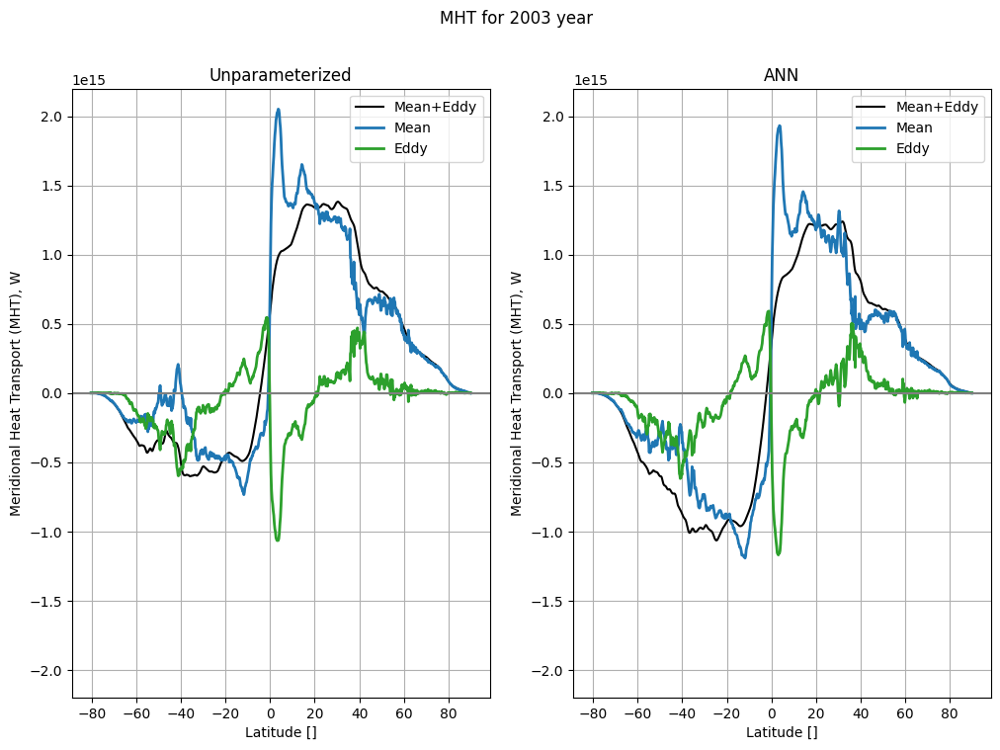

In [7]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
MHT_full_code_ctrl.plot(label='Mean+Eddy', color='k')
MHT_mean_ctrl.plot(label='Mean', lw=2)
(MHT_full_code_ctrl - MHT_mean_ctrl).plot(label='Eddy', color='tab:green', lw=2)
plt.axhline(y=0, color='gray')
plt.legend()
plt.title('Unparameterized')
plt.ylabel('Meridional Heat Transport (MHT), W')
plt.ylim([-2.2e+15,2.2e+15])
plt.xticks([-80,-60,-40,-20,0,20,40,60,80])
plt.grid()

plt.subplot(1,2,2)
MHT_full_code_ann.plot(label='Mean+Eddy', color='k')
MHT_mean_ann.plot(label='Mean', lw=2)
(MHT_full_code_ann - MHT_mean_ann).plot(label='Eddy', color='tab:green', lw=2)
plt.axhline(y=0, color='gray')
plt.legend()
plt.title('ANN')
plt.ylabel('Meridional Heat Transport (MHT), W')
plt.ylim([-2.2e+15,2.2e+15])
plt.xticks([-80,-60,-40,-20,0,20,40,60,80])
plt.grid()
plt.suptitle('MHT for 2003 year')
plt.savefig('presentation/MHT.pdf')

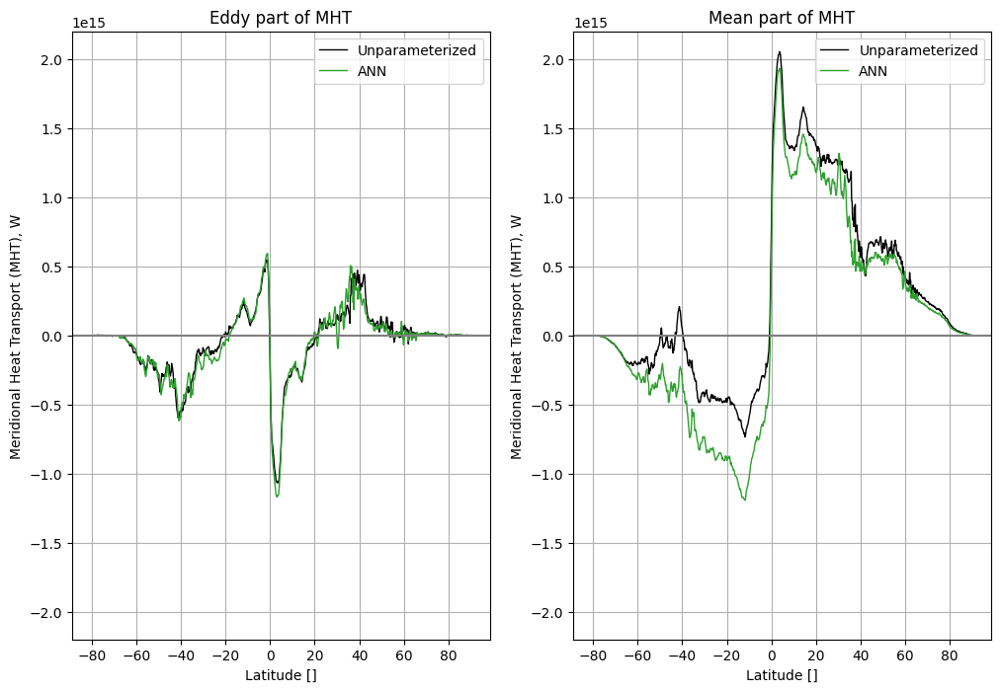

In [12]:
plt.figure(figsize=(12,8))
plt.subplot(1,2,1)
(MHT_full_code_ctrl - MHT_mean_ctrl).plot(label='Unparameterized', color='k', lw=1)
(MHT_full_code_ann - MHT_mean_ann).plot(label='ANN', color='tab:green', lw=1)
plt.axhline(y=0, color='gray')
plt.legend()
plt.title('Eddy part of MHT')
plt.ylabel('Meridional Heat Transport (MHT), W')
plt.ylim([-2.2e+15,2.2e+15])
plt.xticks([-80,-60,-40,-20,0,20,40,60,80])
plt.grid()

plt.subplot(1,2,2)
(MHT_mean_ctrl).plot(label='Unparameterized', color='k', lw=1)
(MHT_mean_ann).plot(label='ANN', color='tab:green', lw=1)
plt.axhline(y=0, color='gray')
plt.legend()
plt.title('Mean part of MHT')
plt.ylabel('Meridional Heat Transport (MHT), W')
plt.ylim([-2.2e+15,2.2e+15])
plt.xticks([-80,-60,-40,-20,0,20,40,60,80])
plt.grid()

Text(0.5, 0, 'Latitude')

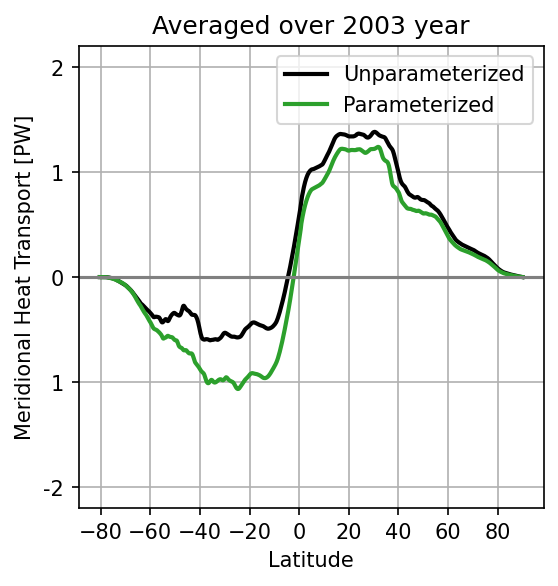

In [74]:
plt.figure(figsize=(4,4), dpi=150)
(MHT_full_code_ctrl).plot(label='Unparameterized', color='k', lw=2)
(MHT_full_code_ann).plot(label='Parameterized', color='tab:green', lw=2)
plt.axhline(y=0, color='gray')
plt.legend()
plt.title('Averaged over 2003 year')
plt.ylabel('Meridional Heat Transport [PW]')
plt.ylim([-2.2e+15,2.2e+15])
plt.xticks([-80,-60,-40,-20,0,20,40,60,80])
plt.yticks([-2e15, -1e15, 0, 1e15, 2e15], [-2,1,0,1,2])
plt.grid()
plt.xlabel('Latitude')

# Test that temporal variation of MHT is big

In [59]:
exp = ds['unparameterized']
Q = rho0 * Cp * grid.interp(exp.ocean_annual_z.thetao, 'Y') * exp.ocean_annual_z.vo * param.dxCv * exp.dz
MHT_mean_ctrl_series = Q.sum('xh').sum('zl').squeeze().compute()

In [60]:
exp = ds['ANN']
Q = rho0 * Cp * grid.interp(exp.ocean_annual_z.thetao, 'Y') * exp.ocean_annual_z.vo * param.dxCv * exp.dz
MHT_mean_ann_series = Q.sum('xh').sum('zl').squeeze().compute()

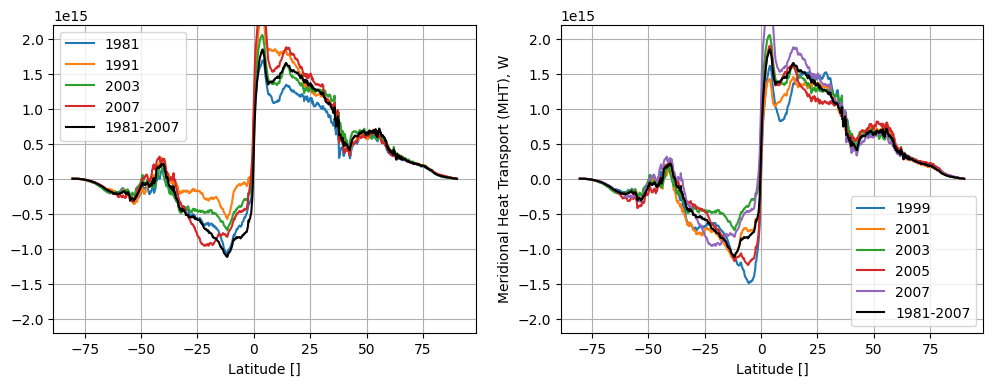

In [65]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
for year in ['1981', '1991', '2003', '2007']:
    MHT_mean_ctrl_series.sel(time=year).plot(label=year)
plt.ylabel('Meridional Heat Transport (MHT), W')
MHT_mean_ctrl_series.sel(time=slice('1981','2007')).mean('time').plot(label='1981-2007', color='k')
plt.ylim([-2.2e+15,2.2e+15])
plt.grid()
plt.legend()

plt.subplot(1,2,2)
for year in ['1999', '2001', '2003', '2005', '2007']:
    MHT_mean_ctrl_series.sel(time=year).plot(label=year)
MHT_mean_ctrl_series.sel(time=slice('1981','2007')).mean('time').plot(label='1981-2007', color='k')
plt.ylabel('Meridional Heat Transport (MHT), W')
plt.ylim([-2.2e+15,2.2e+15])
plt.grid()
plt.legend()


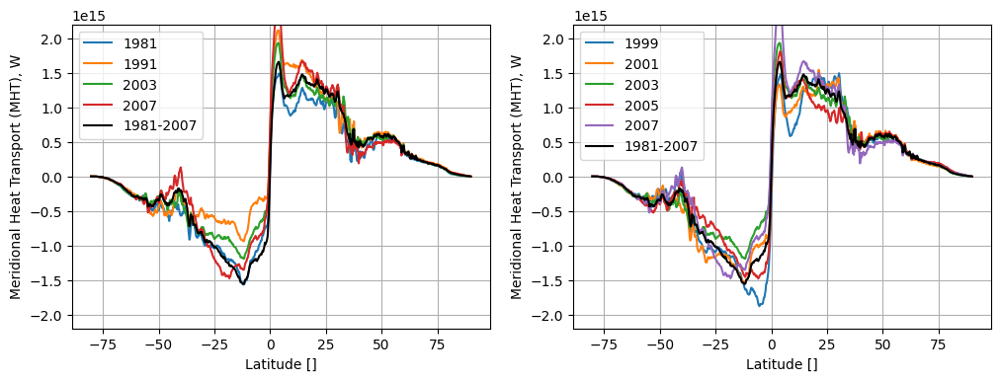

In [66]:
plt.figure(figsize=(12,4))
plt.subplot(1,2,1)
for year in ['1981', '1991', '2003', '2007']:
    MHT_mean_ann_series.sel(time=year).plot(label=year)
MHT_mean_ann_series.sel(time=slice('1981','2007')).mean('time').plot(label='1981-2007', color='k')
plt.ylabel('Meridional Heat Transport (MHT), W')
plt.ylim([-2.2e+15,2.2e+15])
plt.grid()
plt.legend()

plt.subplot(1,2,2)
for year in ['1999', '2001', '2003', '2005', '2007']:
    MHT_mean_ann_series.sel(time=year).plot(label=year)
MHT_mean_ann_series.sel(time=slice('1981','2007')).mean('time').plot(label='1981-2007', color='k')
plt.ylabel('Meridional Heat Transport (MHT), W')
plt.ylim([-2.2e+15,2.2e+15])
plt.grid()
plt.legend()


# Temperature drift

In [3]:
woa_temp = ds['unparameterized'].woa_temp
R = 6.378e+6 # Earth radius
dy = R * 1./360. * 2 * np.pi
dx = dy * np.cos(woa_temp.yh * np.pi/180.)
def ave(x):
    out = ((x * dy * dx).sum(['xh','yh']) / (xr.where(np.isnan(x),0.0,1.0) * dy * dx).sum(['xh','yh'])).compute()
    return out - out.isel(time=0)

In [17]:
drift_ctrl = ave(ds['unparameterized'].thetao)

In [18]:
drift_ann = ave(ds['ANN'].thetao)

In [6]:
drift_so_ctrl = ave(ds['unparameterized'].salto)

In [7]:
drift_so_ann = ave(ds['ANN'].salto)

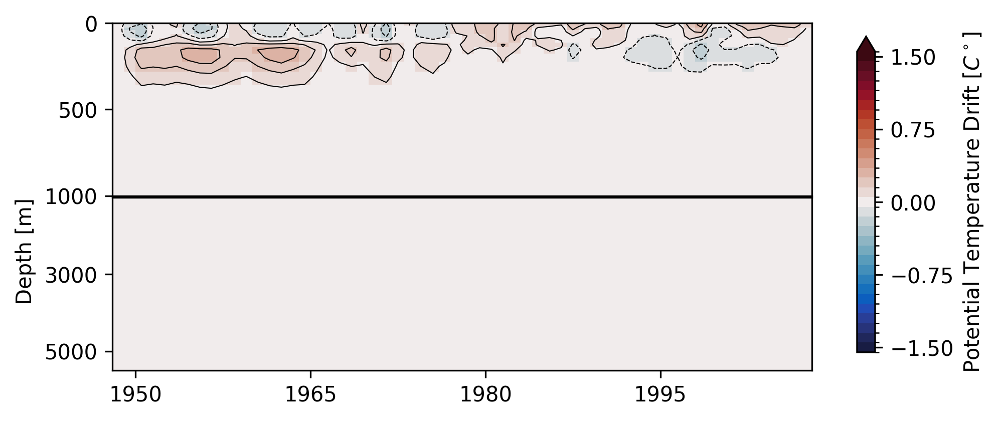

In [62]:
plt.figure(figsize=(6,3), dpi=300)

cmap = cmocean.cm.balance
levels = np.arange(-1.55,1.60,0.1)
norm = plt.matplotlib.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)

plt.subplot(2,1,1)
drift_ctrl.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_ctrl.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([0,1000])
plt.gca().invert_yaxis()
plt.xticks([1950, 1965, 1980, 1995], ['']*4)
plt.xlabel('')
plt.ylabel('')
plt.yticks([0,500,1000])

plt.subplot(2,1,2)
im = drift_ctrl.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_ctrl.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([1000,5500])
plt.ylabel('')
plt.gca().invert_yaxis()
plt.xlabel('')
plt.ylabel('Depth [m]', loc='top')
plt.yticks([3000,5000])

plt.gcf().subplots_adjust(hspace=0.01)
cbar_ax = plt.gcf().add_axes([0.95, 0.15, 0.02, 0.7])
cbar = plt.gcf().colorbar(im, cax=cbar_ax, extend='max', label='Potential Temperature Drift [$C^\circ$]')
cbar.ax.set_yticks([-1.5, -0.75, 0, 0.75, 1.5])

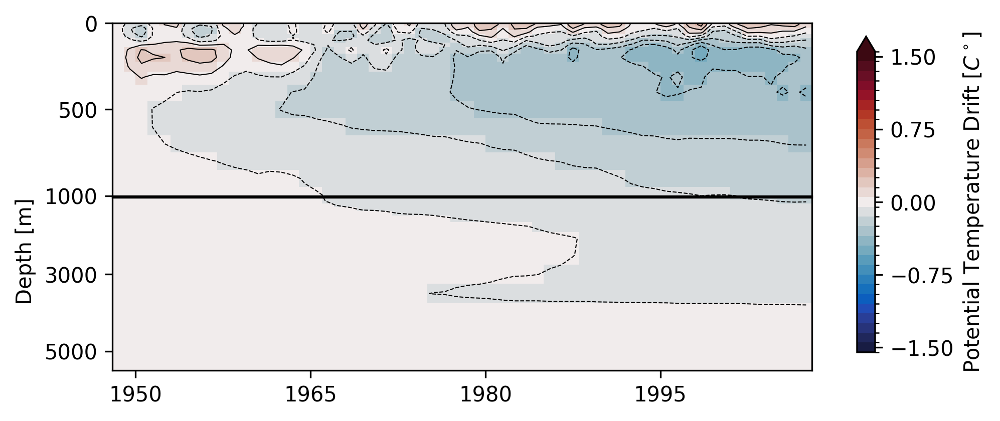

In [63]:
plt.figure(figsize=(6,3), dpi=300)

cmap = cmocean.cm.balance
levels = np.arange(-1.55,1.60,0.1)
norm = plt.matplotlib.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)

plt.subplot(2,1,1)
drift_ann.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_ann.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([0,1000])
plt.gca().invert_yaxis()
plt.xticks([1950, 1965, 1980, 1995], ['']*4)
plt.xlabel('')
plt.ylabel('')
plt.yticks([0,500,1000])

plt.subplot(2,1,2)
im = drift_ann.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_ann.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([1000,5500])
plt.ylabel('')
plt.gca().invert_yaxis()
plt.xlabel('')
plt.ylabel('Depth [m]', loc='top')
plt.yticks([3000,5000])

plt.gcf().subplots_adjust(hspace=0.01)
cbar_ax = plt.gcf().add_axes([0.95, 0.15, 0.02, 0.7])
cbar = plt.gcf().colorbar(im, cax=cbar_ax, extend='max', label='Potential Temperature Drift [$C^\circ$]')
cbar.ax.set_yticks([-1.5, -0.75, 0, 0.75, 1.5])

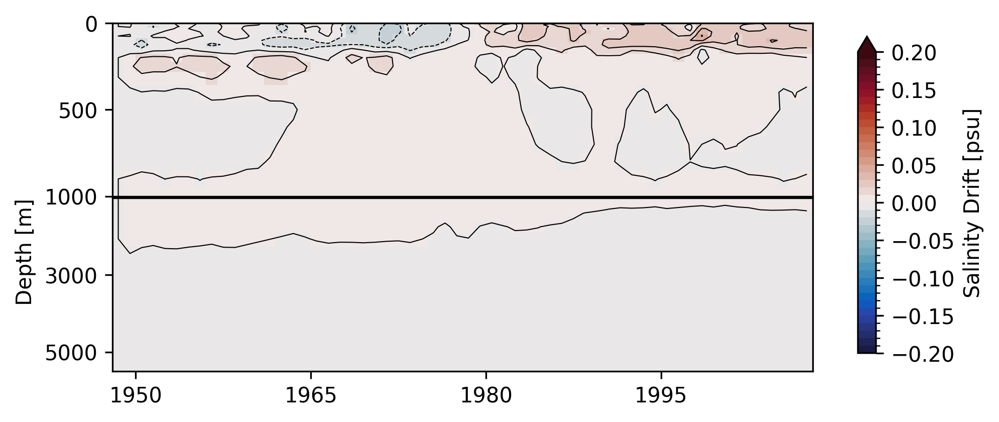

In [10]:
plt.figure(figsize=(6,3), dpi=300)

cmap = cmocean.cm.balance
levels = np.arange(-0.2,0.21,0.01)
norm = plt.matplotlib.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)

plt.subplot(2,1,1)
drift_so_ctrl.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_so_ctrl.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([0,1000])
plt.gca().invert_yaxis()
plt.xticks([1950, 1965, 1980, 1995], ['']*4)
plt.xlabel('')
plt.ylabel('')
plt.yticks([0,500,1000])

plt.subplot(2,1,2)
im = drift_so_ctrl.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_so_ctrl.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([1000,5500])
plt.ylabel('')
plt.gca().invert_yaxis()
plt.xlabel('')
plt.ylabel('Depth [m]', loc='top')
plt.yticks([3000,5000])

plt.gcf().subplots_adjust(hspace=0.01)
cbar_ax = plt.gcf().add_axes([0.95, 0.15, 0.02, 0.7])
cbar = plt.gcf().colorbar(im, cax=cbar_ax, extend='max', label='Salinity Drift [psu]')
#cbar.ax.set_yticks([-1.5, -0.75, 0, 0.75, 1.5])

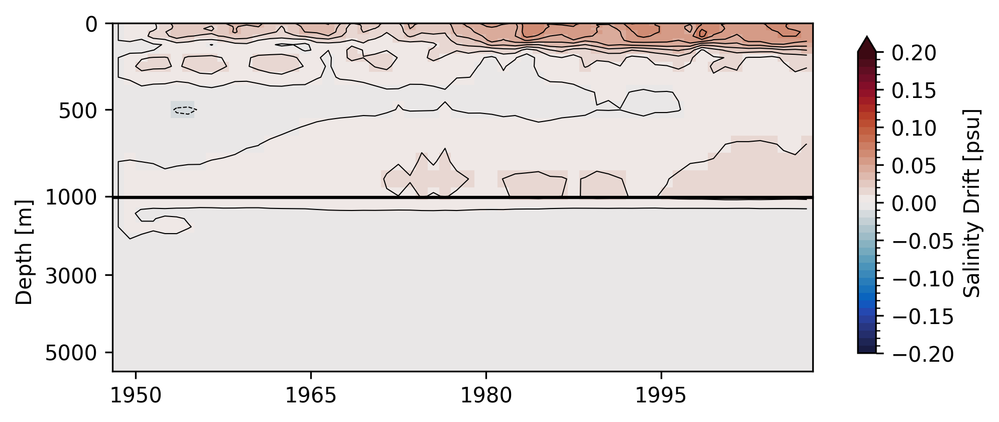

In [11]:
plt.figure(figsize=(6,3), dpi=300)

cmap = cmocean.cm.balance
levels = np.arange(-0.2,0.21,0.01)
norm = plt.matplotlib.colors.BoundaryNorm(boundaries=levels, ncolors=cmap.N)

plt.subplot(2,1,1)
drift_so_ann.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_so_ann.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([0,1000])
plt.gca().invert_yaxis()
plt.xticks([1950, 1965, 1980, 1995], ['']*4)
plt.xlabel('')
plt.ylabel('')
plt.yticks([0,500,1000])

plt.subplot(2,1,2)
im = drift_so_ann.plot.pcolormesh(add_colorbar=False, norm=norm, cmap=cmap)
drift_so_ann.plot.contour(colors='k', levels=levels, linewidths=0.5)
plt.ylim([1000,5500])
plt.ylabel('')
plt.gca().invert_yaxis()
plt.xlabel('')
plt.ylabel('Depth [m]', loc='top')
plt.yticks([3000,5000])

plt.gcf().subplots_adjust(hspace=0.01)
cbar_ax = plt.gcf().add_axes([0.95, 0.15, 0.02, 0.7])
cbar = plt.gcf().colorbar(im, cax=cbar_ax, extend='max', label='Salinity Drift [psu]')
#cbar.ax.set_yticks([-1.5, -0.75, 0, 0.75, 1.5])

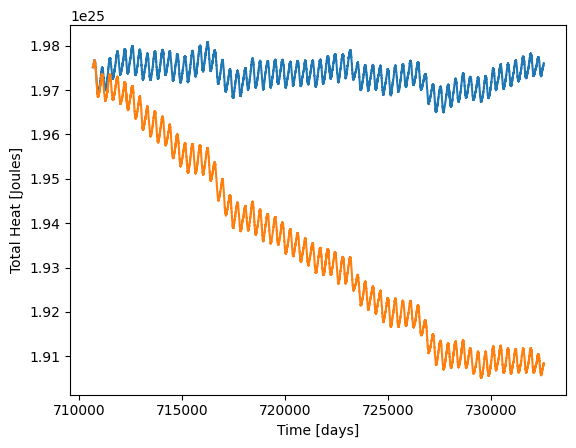

In [15]:
ds['unparameterized'].series.Heat.plot()
ds['ANN'].series.Heat.plot()

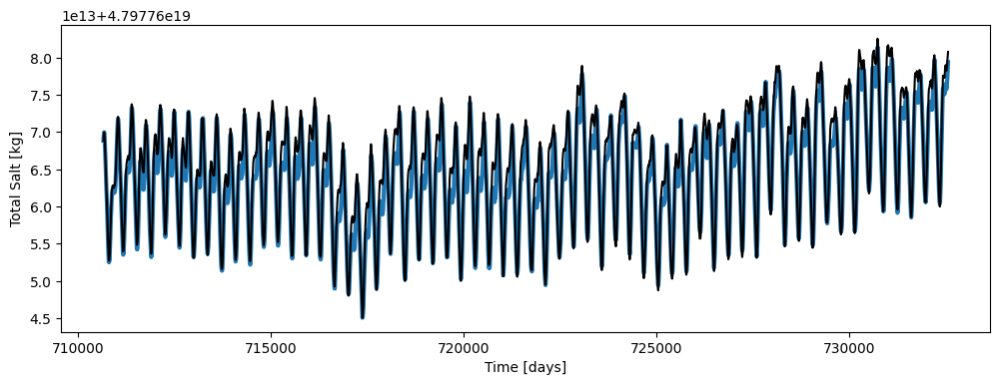

In [19]:
plt.figure(figsize=(12,4))
ds['unparameterized'].series.Salt.plot(lw=3)
ds['ANN'].series.Salt.plot(color='k')

# Salinity biases

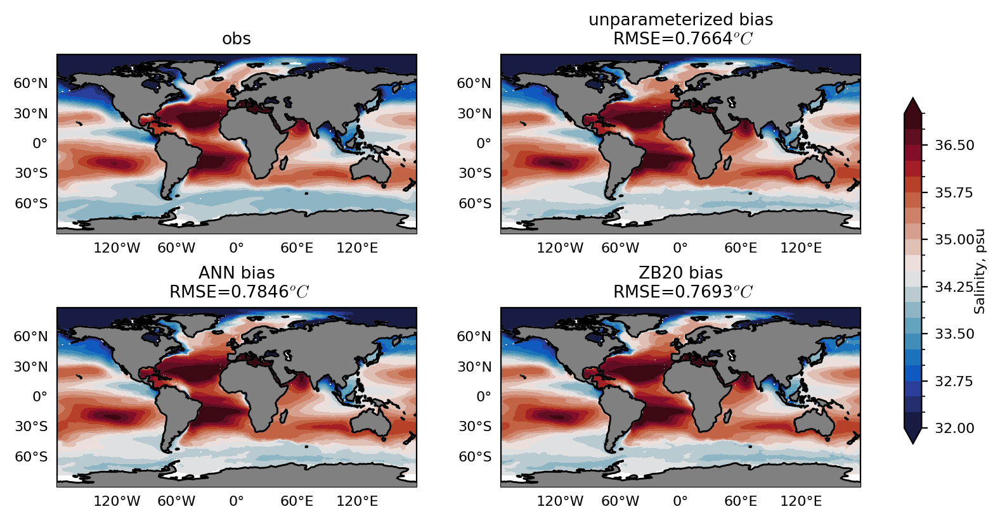

In [27]:
ds.plot_so(['obs', 'unparameterized', 'ANN','ZB20'])

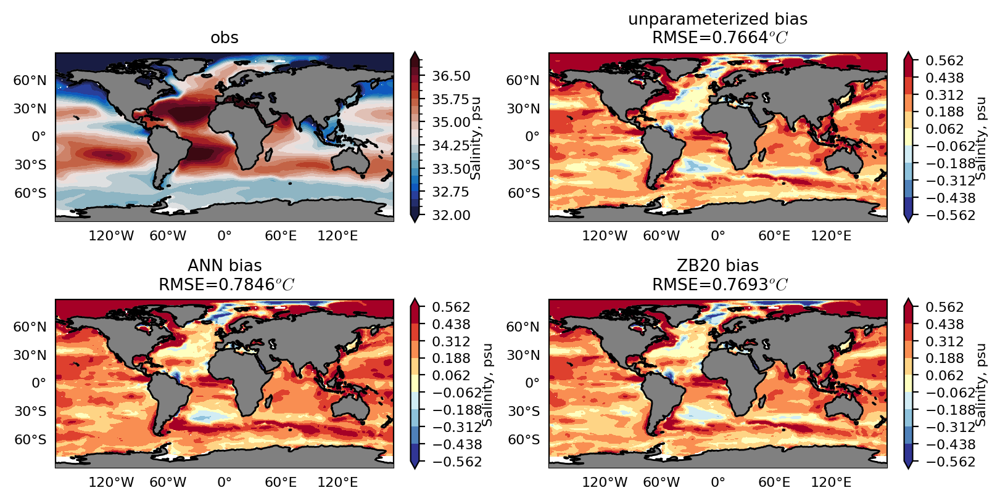

In [45]:
ds.plot_so(['obs', 'unparameterized', 'ANN','ZB20'], plot_type='bias')

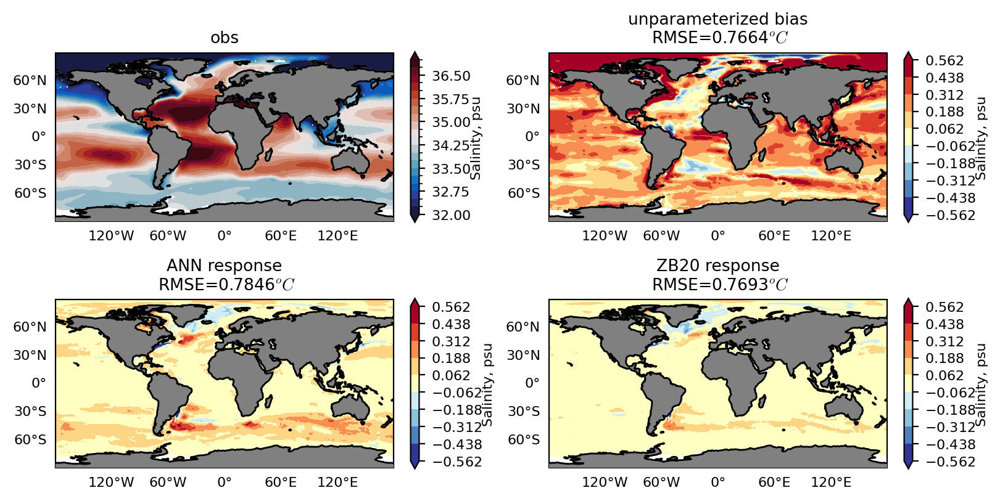

In [46]:
ds.plot_so(['obs', 'unparameterized', 'ANN','ZB20'], plot_type='response')

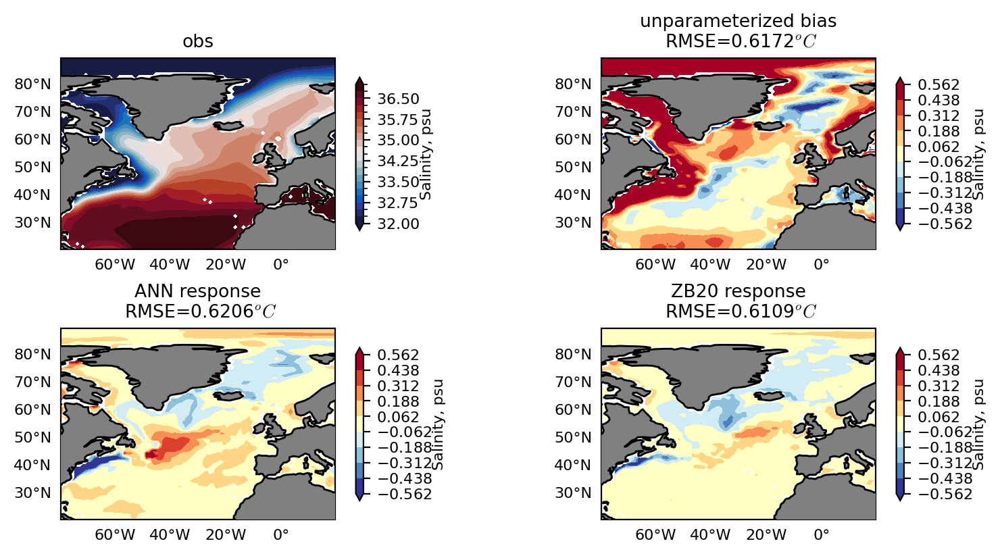

In [21]:
ds.plot_so(['obs', 'unparameterized', 'ANN','ZB20'], plot_type='response', select=select_NA_Jenny)

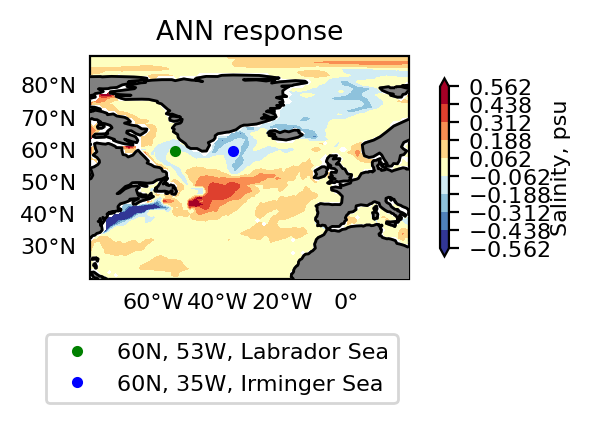

In [40]:
ds.plot_so(['ANN'], plot_type='response', select=select_NA_Jenny)
plt.plot(-53,60, marker='o', ls='', markersize=3, transform = ccrs.PlateCarree(), color='g', label='60N, 53W, Labrador Sea')
plt.plot(-35,60, marker='o', ls='', markersize=3,transform = ccrs.PlateCarree(), color='b', label='60N, 35W, Irminger Sea')
plt.legend(bbox_to_anchor=(1,-0.2))

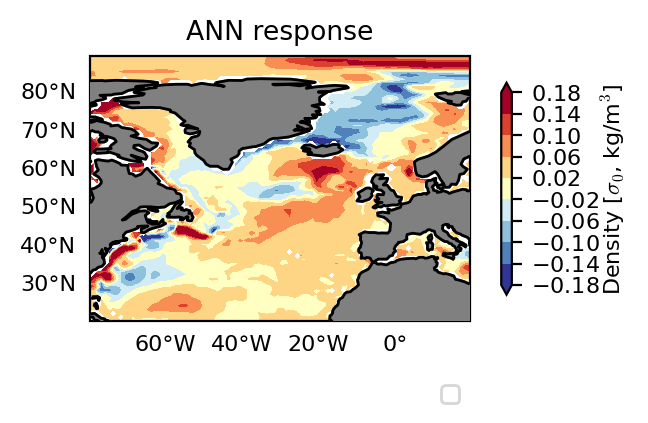

In [52]:
ds.plot_sigma0(['ANN'], plot_type='response', select=select_NA_Jenny)
#plt.plot(-53,60, marker='o', ls='', markersize=3, transform = ccrs.PlateCarree(), color='g', label='60N, 53W, Labrador Sea')
#plt.plot(-35,60, marker='o', ls='', markersize=3,transform = ccrs.PlateCarree(), color='b', label='60N, 35W, Irminger Sea')
plt.legend(bbox_to_anchor=(1,-0.2))

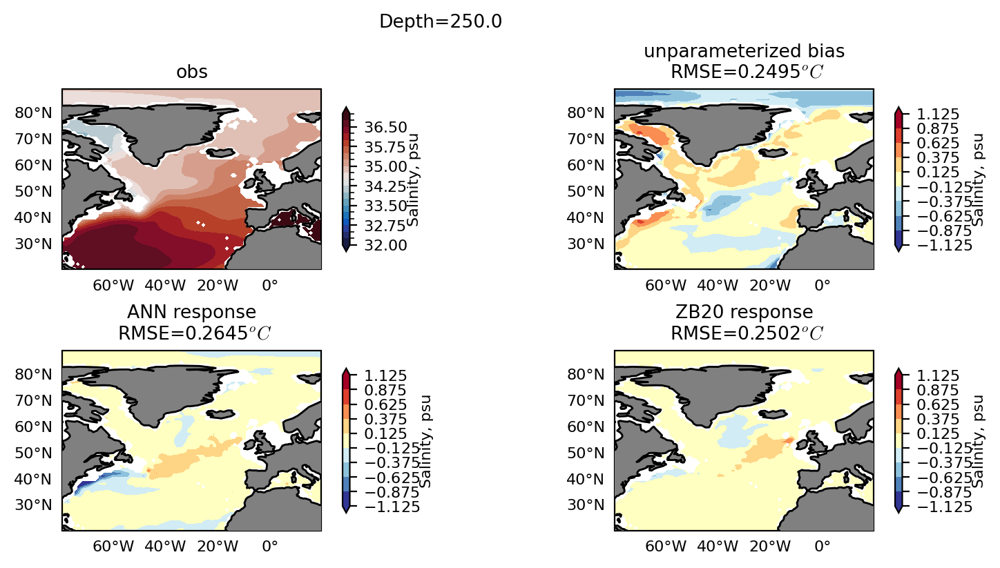

In [32]:
ds.plot_so(['obs', 'unparameterized', 'ANN','ZB20'], plot_type='response', select=select_NA_Jenny, zl=10)

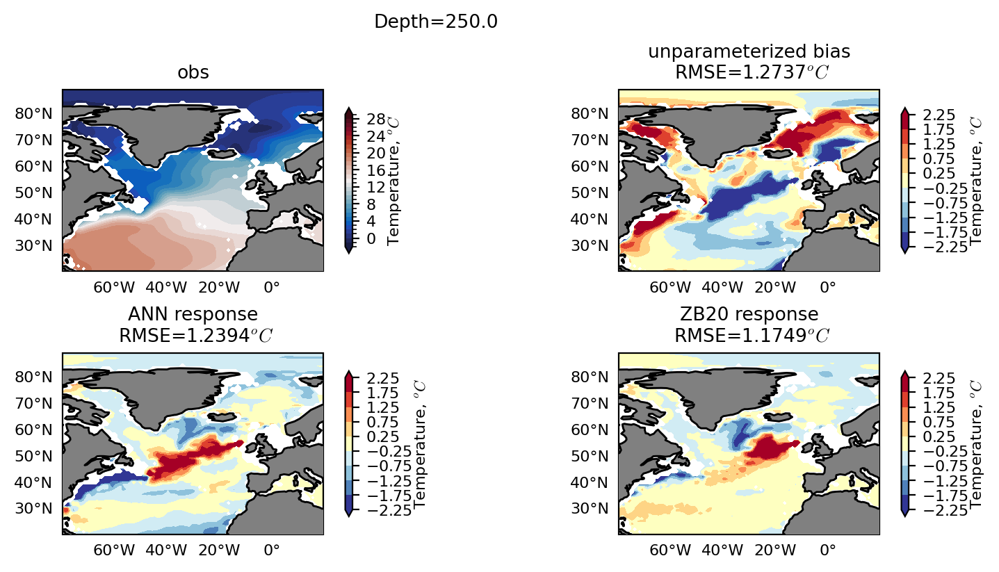

In [35]:
ds.plot_temp(['obs', 'unparameterized', 'ANN','ZB20'], plot_type='response', select=select_NA_Jenny, zl=10)

# Stratification in Labrador Sea

In [14]:
MLD_winter_ann = select_NA_Jenny(ds['ANN'].ocean_month.MLD_003.sel(time=slice('1981','2007')).groupby('time.month').mean('time').max('month')).compute()

In [15]:
MLD_winter_ctrl = select_NA_Jenny(ds['unparameterized'].ocean_month.MLD_003.sel(time=slice('1981','2007')).groupby('time.month').mean('time').max('month')).compute()

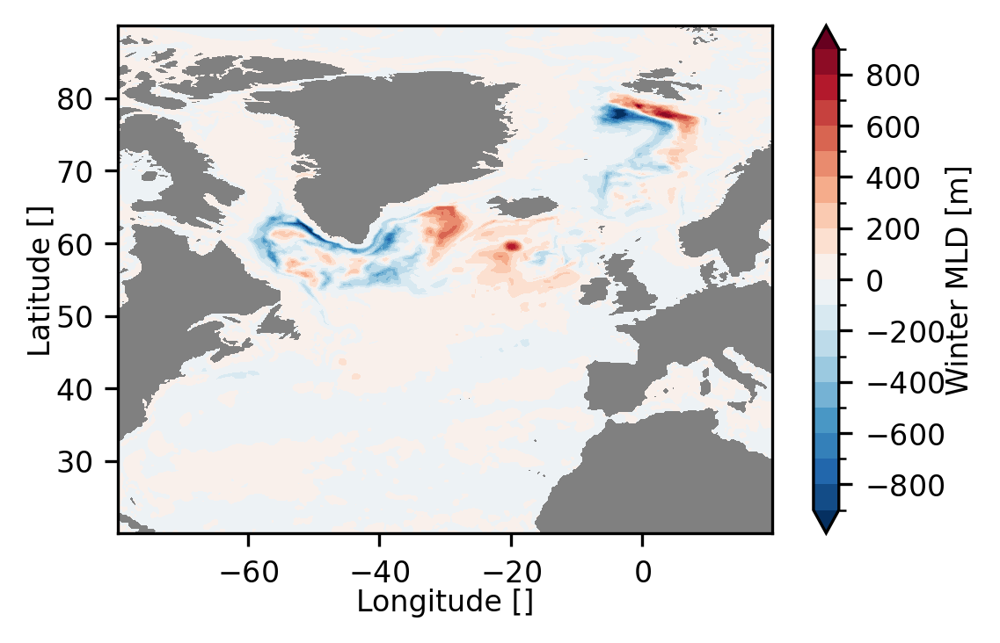

In [34]:
plt.figure(figsize=(4,2.5), dpi=300)
(MLD_winter_ann-MLD_winter_ctrl).plot.contourf(cbar_kwargs={'label': 'Winter MLD [m]'}, levels=np.arange(-900,950,100))
plt.gca().set_facecolor('gray')

Text(0.5, 1.0, 'WOA18')

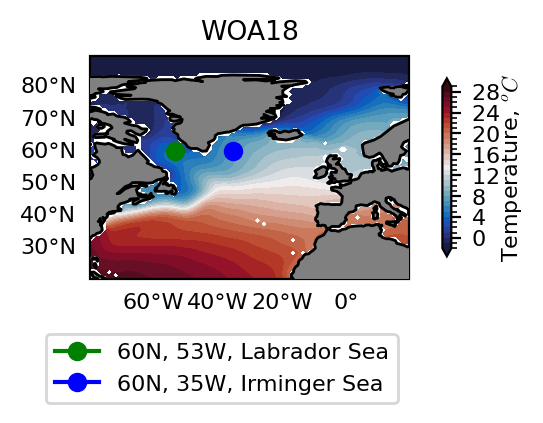

In [107]:
ds.plot_temp(['obs'],select=select_NA_Jenny)
plt.plot(-53,60, marker='o', transform = ccrs.PlateCarree(), color='g', label='60N, 53W, Labrador Sea')
#plt.plot(0,75, marker='o', transform = ccrs.PlateCarree(), color='r', label='75N, 0W, Greenland Sea')
plt.plot(-35,60, marker='o', transform = ccrs.PlateCarree(), color='b', label='60N, 35W, Irminger Sea')
#plt.plot(10,70, marker='o', transform = ccrs.PlateCarree(), color='y', label='75N, 10E, Norwegian Sea')
plt.legend(bbox_to_anchor=(1,-0.2))
plt.title('WOA18')

In [108]:
def plot_profiles(lat=60,lon=-53, label='Labrador Sea'):
    plt.figure(figsize=(6,3), dpi=300)
    plt.subplot(1,3,1)
    ds['unparameterized'].woa_temp.interp(xh=lon,yh=lat).plot(color='k', y='zl', label='WOA18')
    ds['unparameterized'].thetao.sel(time=slice('1981','2007')).mean('time').interp(xh=lon,yh=lat).plot(y='zl', label='Unparameterized')
    ds['ANN'].thetao.sel(time=slice('1981','2007')).mean('time').interp(xh=lon,yh=lat).plot(y='zl', label='ANN')
    plt.ylim([0,200])
    #plt.xlim([3,5.5])
    plt.grid()
    plt.gca().invert_yaxis()
    plt.xlabel('Potential temperature [$C^\circ$]')
    plt.ylabel('Depth [m]')
    plt.title('')
    
    plt.subplot(1,3,2)
    ds['unparameterized'].woa_salt.interp(xh=lon,yh=lat).plot(color='k', y='zl', label='WOA18')
    ds['unparameterized'].salto.sel(time=slice('1981','2007')).mean('time').interp(xh=lon,yh=lat).plot(y='zl', label='Unparameterized')
    ds['ANN'].salto.sel(time=slice('1981','2007')).mean('time').interp(xh=lon,yh=lat).plot(y='zl', label='ANN')
    plt.ylim([0,200])
    #plt.xlim([34,36])
    plt.grid()
    plt.gca().invert_yaxis()
    plt.xlabel('Salinity [psu]')
    plt.ylabel('Depth [m]')
    plt.title('')
    
    plt.subplot(1,3,3)
    (ds['unparameterized'].N_buoyancy_frequency_woa**2).interp(xh=lon,yh=lat).plot(color='k', y='zl', label='WOA18')
    (ds['unparameterized'].N_buoyancy_frequency**2).sel(time=slice('1981','2007')).mean('time').interp(xh=lon,yh=lat).plot(y='zl', label='Unparameterized')
    (ds['ANN'].N_buoyancy_frequency**2).sel(time=slice('1981','2007')).mean('time').interp(xh=lon,yh=lat).plot(y='zl', label='ANN')
    plt.ylim([0,200])
    #plt.xlim([0,4e-5])
    plt.grid()
    plt.gca().invert_yaxis()
    plt.xlabel('N$^2$ [1/s]')
    plt.ylabel('Depth [m]')
    plt.title('')
    plt.legend()
    
    plt.suptitle(f'T and S structure in {label} ({lat} $N^\circ$ {-lon} $W^\circ$)')
    plt.tight_layout()

In [ ]:
plot_profiles()

In [ ]:
plot_profiles(lat=60,lon=-35, label='Irminger Sea')

# MOC/AMOC

In [53]:
mocz_ctrl = ds['unparameterized'].MOC

generating basin codes


In [54]:
mocz_ann = ds['ANN'].MOC

generating basin codes


In [49]:
amocz_ctrl = ds['unparameterized'].AMOC

generating basin codes


In [50]:
amocz_ann = ds['ANN'].AMOC

generating basin codes


Text(0.5, 29.444444444444432, 'Latitude')

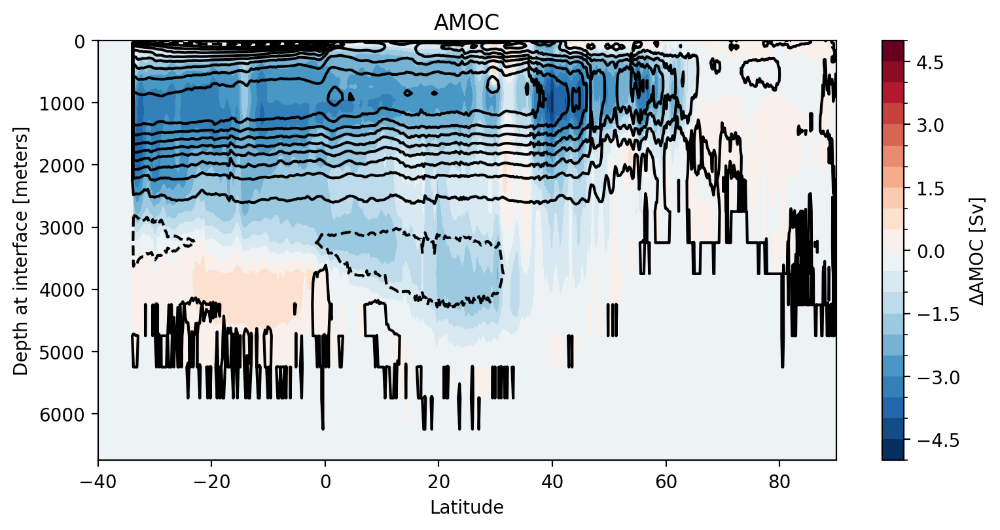

In [115]:
plt.figure(figsize=(8,4), dpi=200)
amoc_ctrl.sel(time=slice('1981','2007')).mean('time').plot.contour(levels=np.arange(-20,22,2), colors='k', linewidth=0.05)
(amoc_ann - amoc_ctrl).sel(time=slice('1981','2007')).mean('time').plot.contourf(levels=np.arange(-5,5.5,0.5), cbar_kwargs={'label': '$\Delta$AMOC [Sv]'})
plt.xlim([-40,None])
plt.gca().invert_yaxis()
plt.tight_layout()
plt.title('AMOC')
plt.xlabel('Latitude')

Text(0.5, 29.444444444444432, 'Latitude')

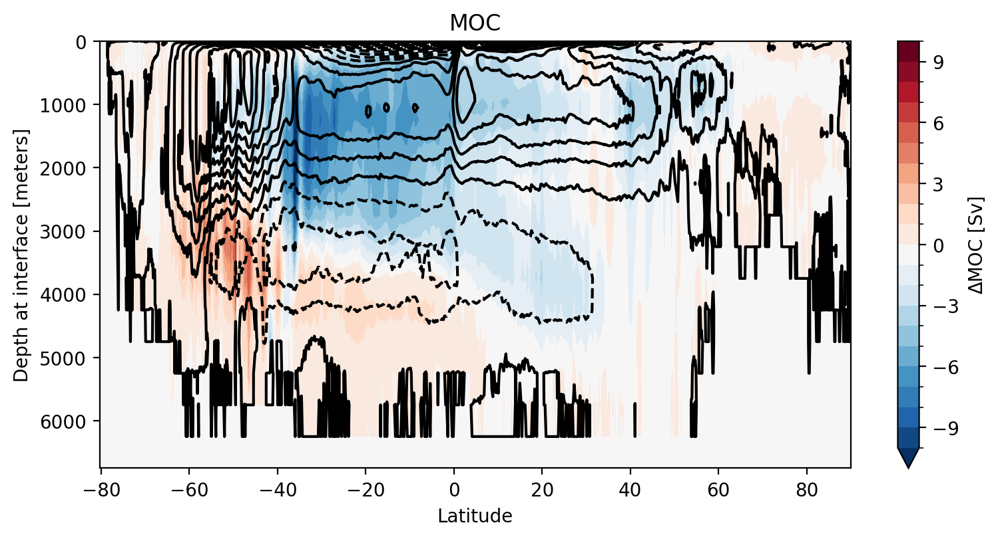

In [116]:
plt.figure(figsize=(8,4), dpi=200)
moc_ctrl.plot.contour(levels=np.arange(-40,42,4), colors='k', linewidth=0.05)
(moc_ann - moc_ctrl).plot.contourf(levels=np.arange(-10,11), cbar_kwargs={'label': '$\Delta$MOC [Sv]'})
plt.gca().invert_yaxis()
plt.tight_layout()
plt.title('MOC')
plt.xlabel('Latitude')

(-80.0, -35.0)

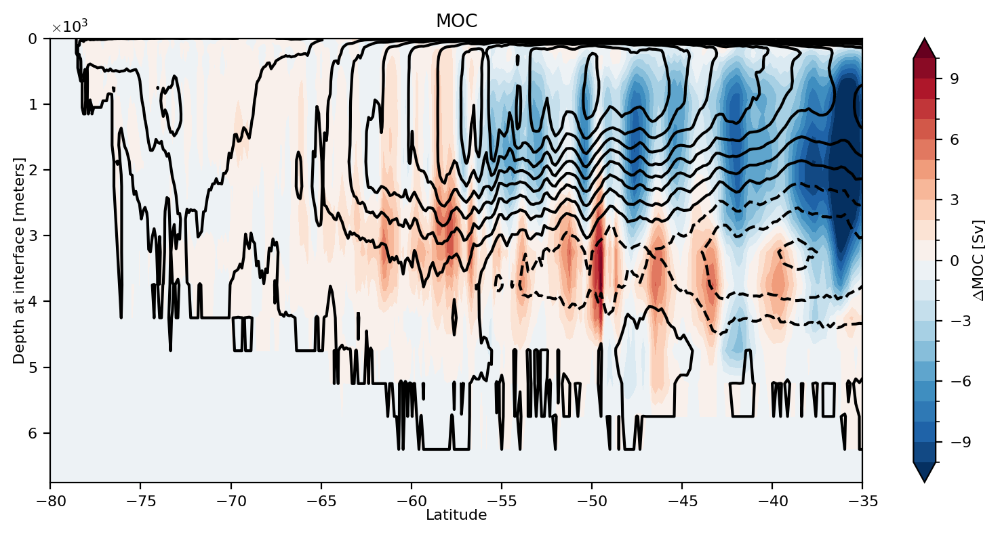

In [62]:
plt.figure(figsize=(8,4), dpi=200)
mocz_ctrl.sel(time='2003').squeeze().plot.contour(levels=np.arange(-40,42,4), colors='k', linewidth=0.05)
(mocz_ann - mocz_ctrl).sel(time='2003').squeeze().plot.contourf(levels=np.arange(-10,11), cbar_kwargs={'label': '$\Delta$MOC [Sv]'})
plt.gca().invert_yaxis()
plt.tight_layout()
plt.title('MOC')
plt.xlabel('Latitude')
plt.xlim([-80,-35])

# MOC/AMOC in rho2 coordinates
AMOC weakens in both z and rho2 coordinates.


In [3]:
amoc = ds['unparameterized'].AMOC_rho2.isel(time=0)

generating basin codes


In [4]:
amoc_ann = ds['ANN'].AMOC_rho2.isel(time=0)

generating basin codes


In [7]:
moc = ds['unparameterized'].MOC_rho2.isel(time=0)

generating basin codes


In [8]:
moc_ann = ds['ANN'].MOC_rho2.isel(time=0)

generating basin codes


In [9]:
zrho = ds['unparameterized'].ocean_annual_rho2.thkcello.mean('xh').cumsum('rho2_l').isel(time=0).compute()

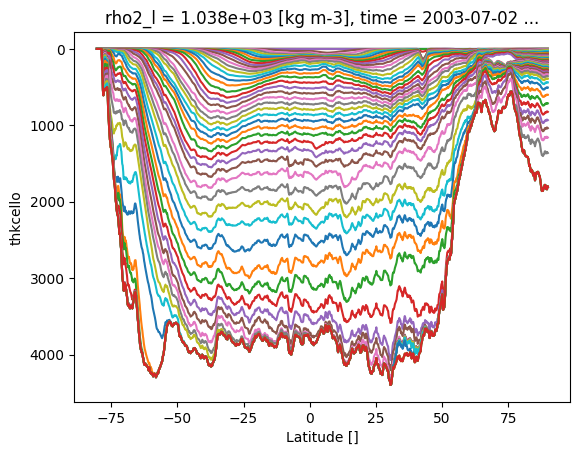

In [10]:
for i in range(64):
    zrho[i].plot()

plt.gca().invert_yaxis()

In [11]:
mask_NA = xr.where(ds['unparameterized'].AMOC_mask_center==1,1.,np.nan)

generating basin codes


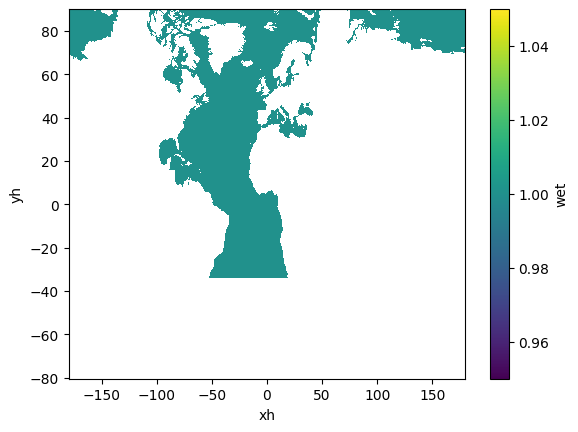

In [12]:
mask_NA.plot()

In [13]:
zrho_NA = (ds['unparameterized'].ocean_annual_rho2.thkcello * mask_NA).mean('xh').cumsum('rho2_l').isel(time=0).compute()

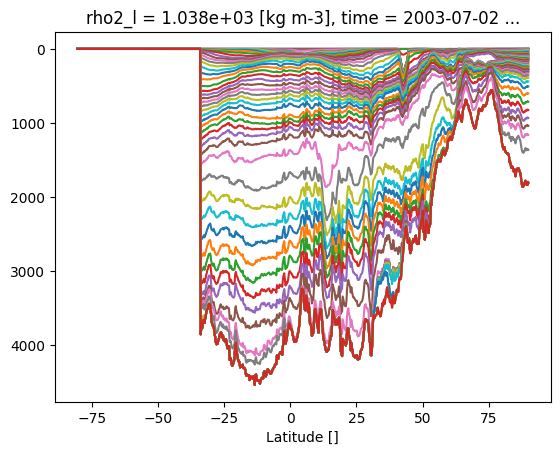

In [14]:
for i in range(64):
    zrho_NA[i].plot()

plt.gca().invert_yaxis()

Text(0.5, 1.0, 'AMOC in $\\sigma_2$')

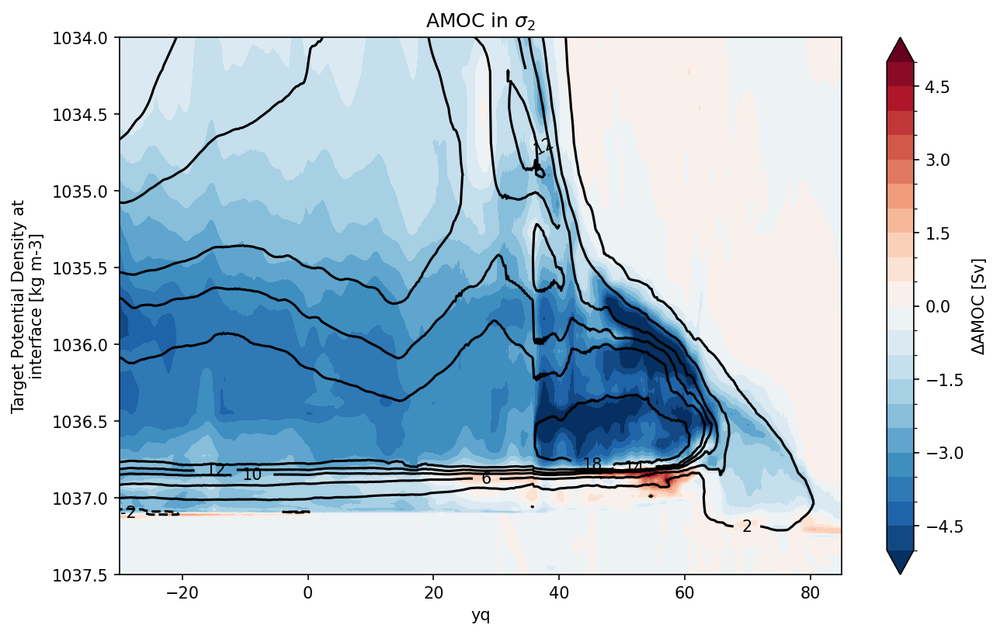

In [16]:
plt.figure(figsize=(10,6), dpi=150)
(amoc_ann-amoc).plot.contourf(levels= np.arange(-5,5+0.5,0.5), cmap='RdBu_r', extend='both', cbar_kwargs={'label': '$\Delta$AMOC [Sv]'})
CS = amoc.plot.contour(colors='k', levels=[-2,2,6,10,12,14,18])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')
plt.ylim([1034,1037.5])
plt.gca().invert_yaxis()
plt.xlim([-30,85])
plt.title('AMOC in $\sigma_2$')

(-30.0, 85.0)

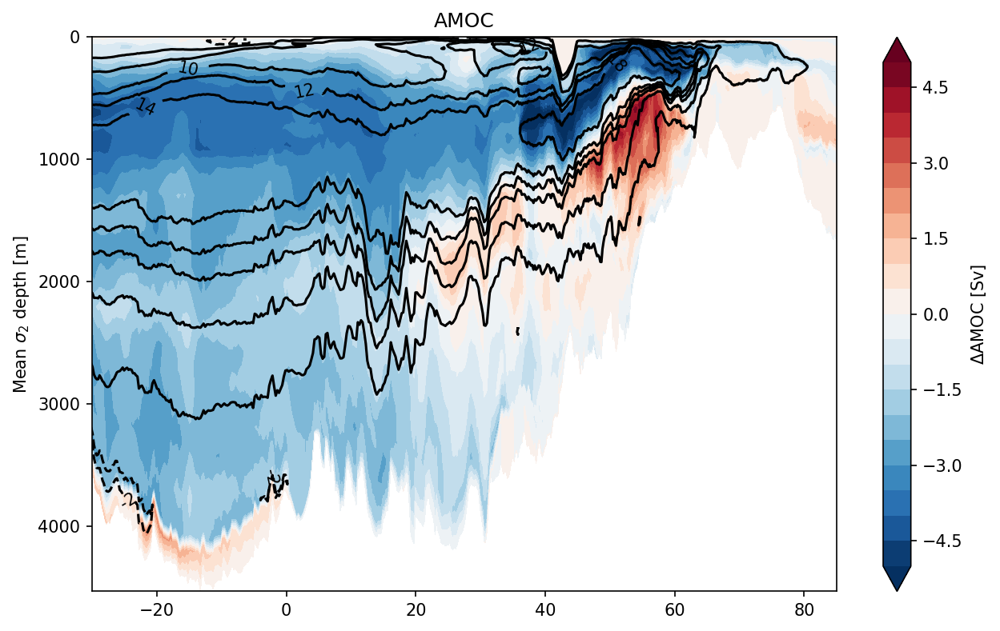

In [23]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho_NA.values
x = amoc.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
im = plt.contourf(x,z,(amoc_ann-amoc)[:-1], levels=np.arange(-5,5+0.5,0.5), cmap='RdBu_r', extend='both')
plt.colorbar(im, label='$\Delta$AMOC [Sv]')
CS = plt.contour(x,z,amoc[:-1], colors='k', levels=[-2,2,6,10,12,14,18])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.ylabel('Mean $\sigma_2$ depth [m]')
plt.title('AMOC')
plt.xlim([-30,85])


Text(0.5, 1.0, '$\\Delta$ SOMOC')

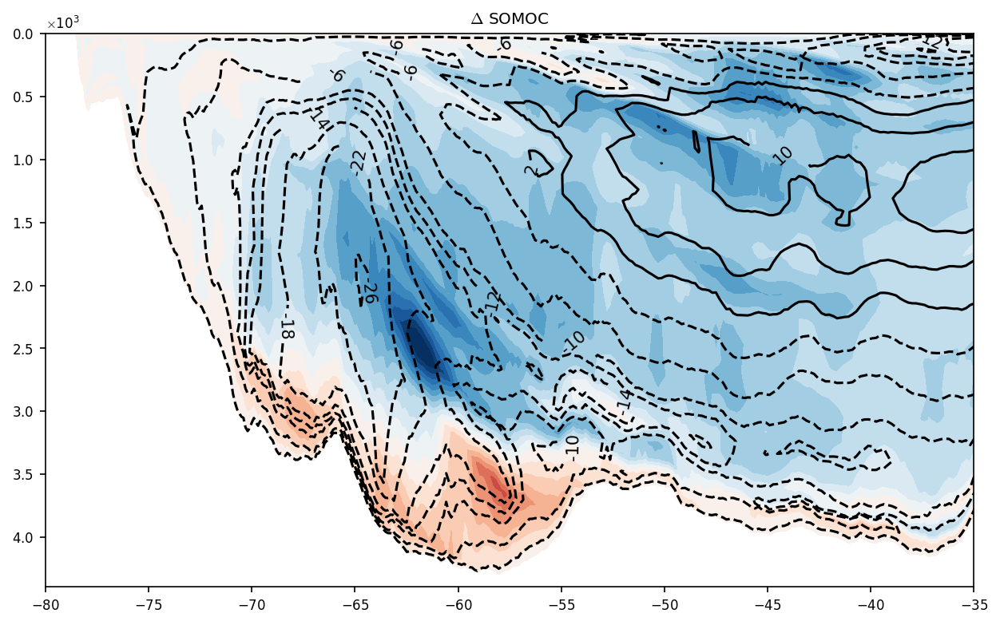

In [141]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
plt.contourf(x,z,(moc_ann-moc)[:-1], levels=np.arange(-20,20+2,2), cmap='RdBu_r', extend='both')
CS = plt.contour(x,z,moc[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('$\Delta$ SOMOC')

Text(0.5, 1.0, 'Control SOMOC')

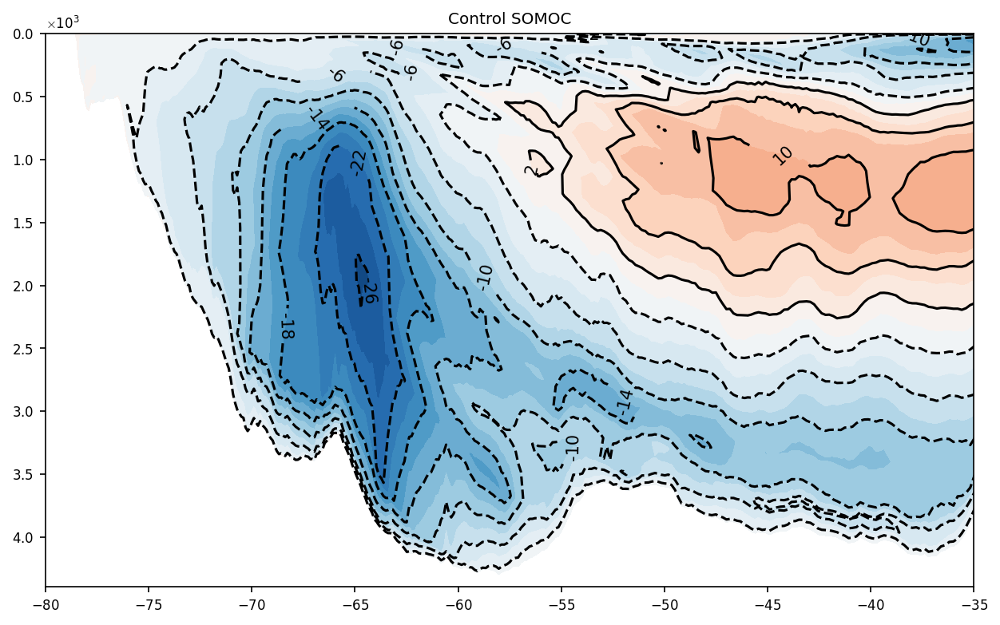

In [142]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
plt.contourf(x,z,(moc)[:-1], levels=np.arange(-30,30+2,2), cmap='RdBu_r', extend='both')
CS = plt.contour(x,z,moc[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-10,-6,-2,2,6,10,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('Control SOMOC')

Text(0.5, 1.0, 'ANN SOMOC')

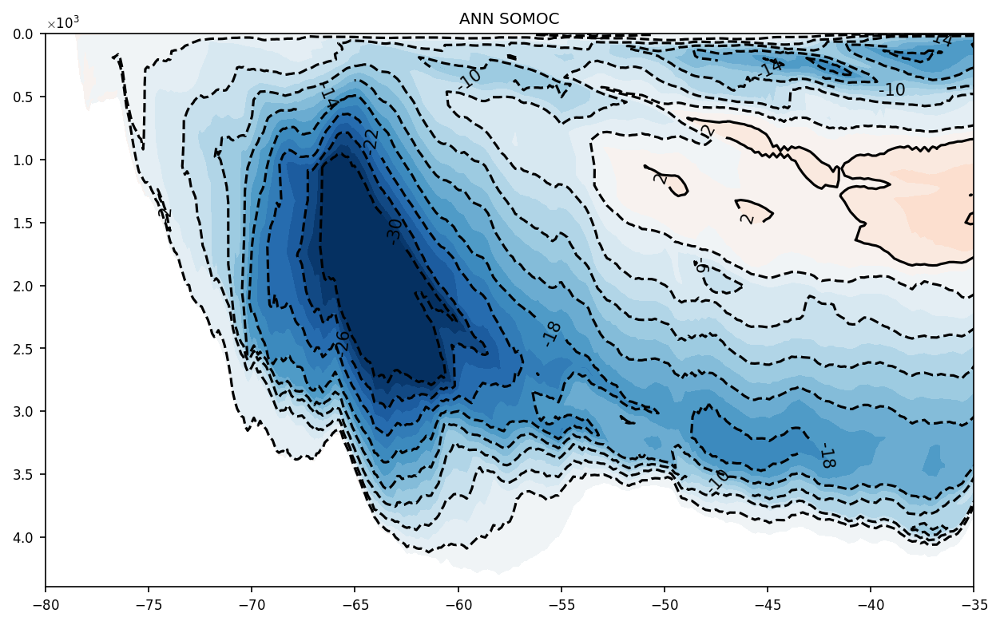

In [143]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
plt.contourf(x,z,(moc_ann)[:-1], levels=np.arange(-30,30+2,2), cmap='RdBu_r', extend='both')
CS = plt.contour(x,z,moc_ann[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-10,-6,-2,2,6,10,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.xlim([-80,-35])
plt.title('ANN SOMOC')

(-80.0, -35.0)

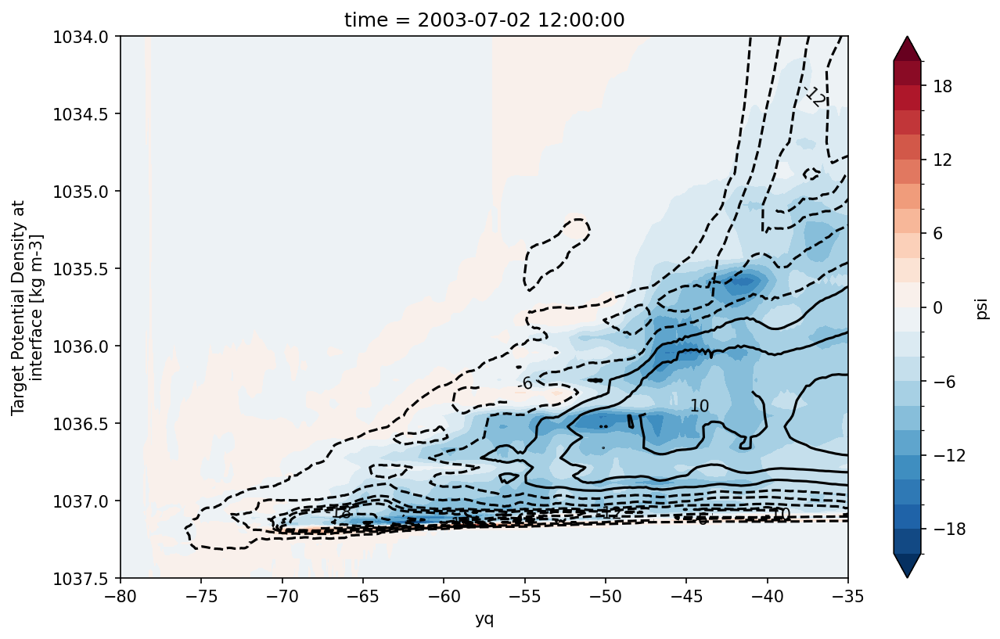

In [43]:
plt.figure(figsize=(10,6), dpi=150)
(moc_ann-moc).plot.contourf(levels= np.arange(-20,20+2,2), cmap='RdBu_r', extend='both')
CS = moc.plot.contour(colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')
plt.ylim([1034,1037.5])
plt.gca().invert_yaxis()
plt.xlim([-80,-35])

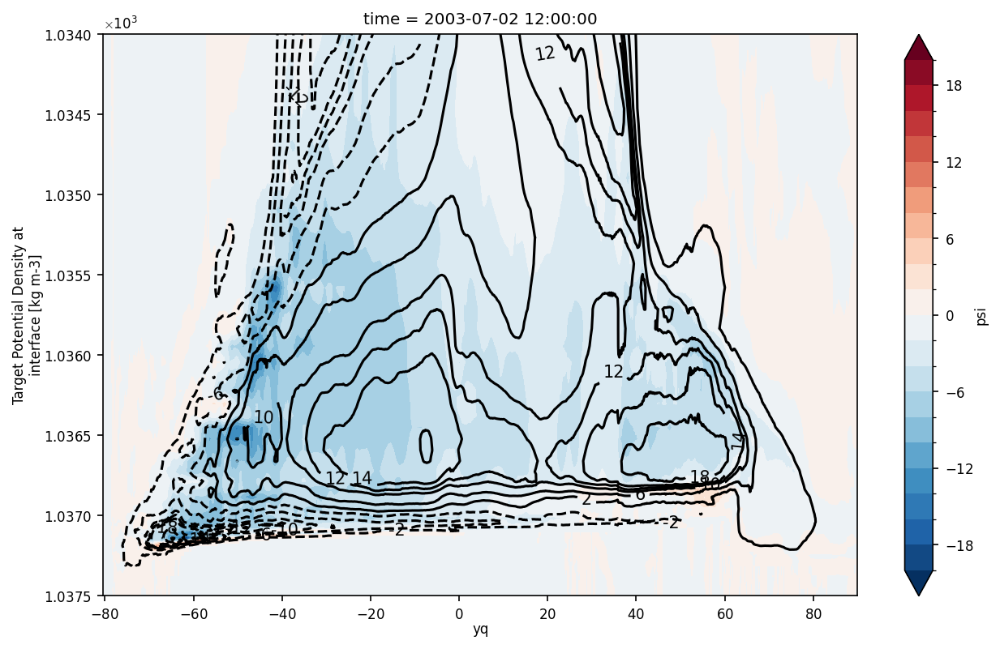

In [144]:
plt.figure(figsize=(10,6), dpi=150)
(moc_ann-moc).plot.contourf(levels= np.arange(-20,20+2,2), cmap='RdBu_r', extend='both')
CS = moc.plot.contour(colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')
plt.ylim([1034,1037.5])
plt.gca().invert_yaxis()

Text(0.5, 1.0, 'Control MOC')

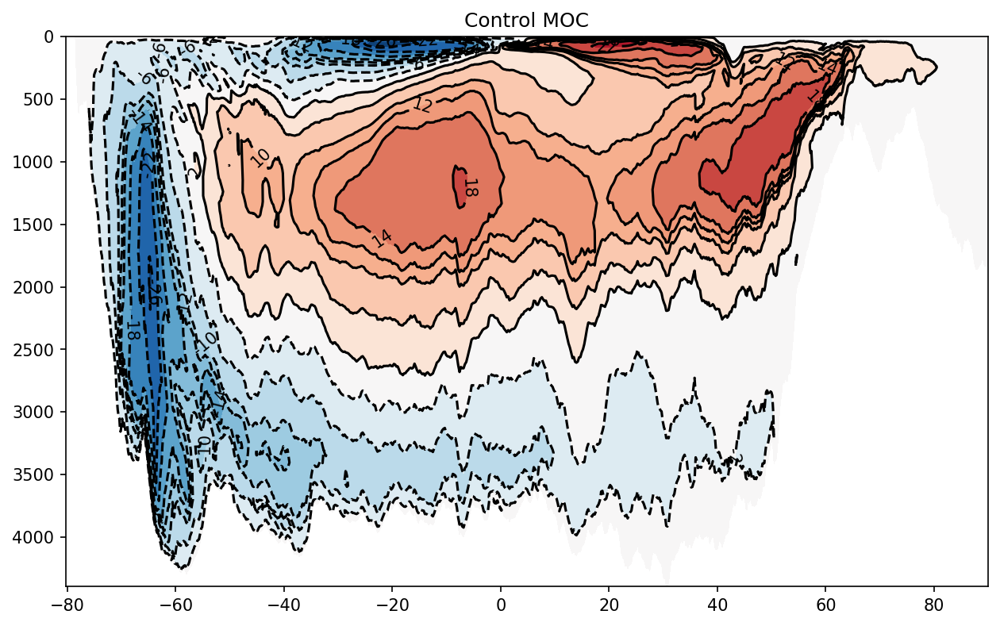

In [27]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
plt.contourf(x,z,(moc)[:-1], levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30], cmap='RdBu_r', extend='both')
CS = plt.contour(x,z,moc[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.title('Control MOC')

Text(0.5, 1.0, 'ANN MOC')

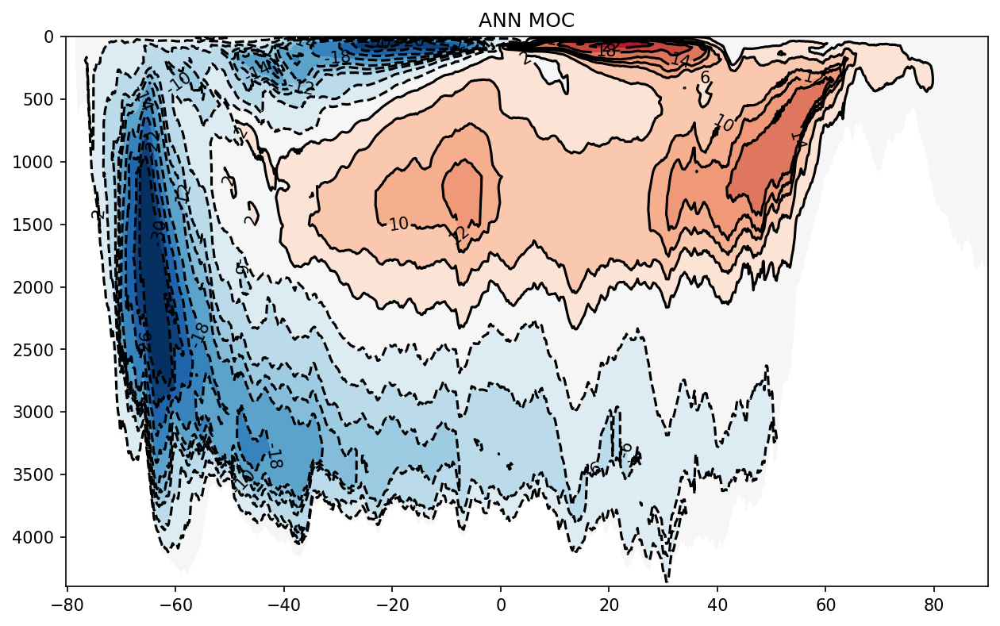

In [28]:
plt.figure(figsize=(10,6), dpi=150)
z = zrho.values
x = moc.yq.values
x = np.vstack([x for i in range(64)]) # Repeat coordinate to create grid

# Here we drop one vertical point because of center/corner difference
plt.contourf(x,z,(moc_ann)[:-1], levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30], cmap='RdBu_r', extend='both')
CS = plt.contour(x,z,moc_ann[:-1], colors='k', levels=[-30,-26,-22,-18,-14,-12,-10,-6,-2,2,6,10,12,14,18,22,26,30])
plt.clabel(CS, inline=1, fontsize=10, fmt='%.0f')

plt.gca().invert_yaxis()
plt.title('ANN MOC')

# AMOC response in short runs

In [29]:
ds_short = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/OM4_SIS2')

In [31]:
amoc_ctrl = ds_short['unparameterized'].AMOC
amoc_ann = ds_short['ANN-greenline'].AMOC
amoc_jh = ds_short['JHAH15'].AMOC

generating basin codes
generating basin codes
generating basin codes


Text(0.5, 29.444444444444432, 'Latitude')

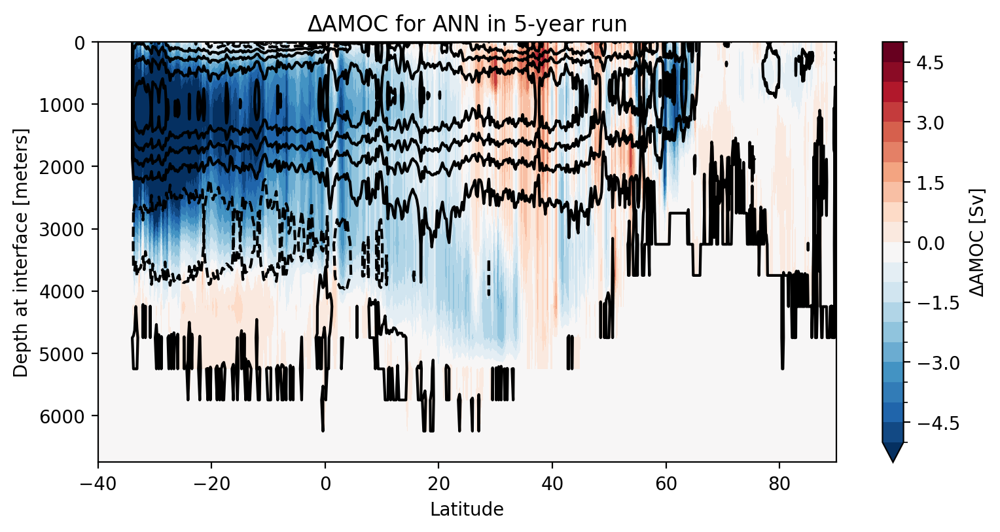

In [33]:
plt.figure(figsize=(8,4), dpi=200)
amoc_ctrl.sel(time=slice('1980','1982')).mean('time').plot.contour(levels=np.arange(-20,22,4), colors='k', linewidth=0.05)
(amoc_ann - amoc_ctrl).sel(time=slice('1980','1982')).mean('time').plot.contourf(levels=np.arange(-5,5.5,0.5), cbar_kwargs={'label': '$\Delta$AMOC [Sv]'})
plt.xlim([-40,None])
plt.gca().invert_yaxis()
plt.tight_layout()
plt.title('$\Delta$AMOC for ANN in 5-year run')
plt.xlabel('Latitude')

Text(0.5, 29.444444444444432, 'Latitude')

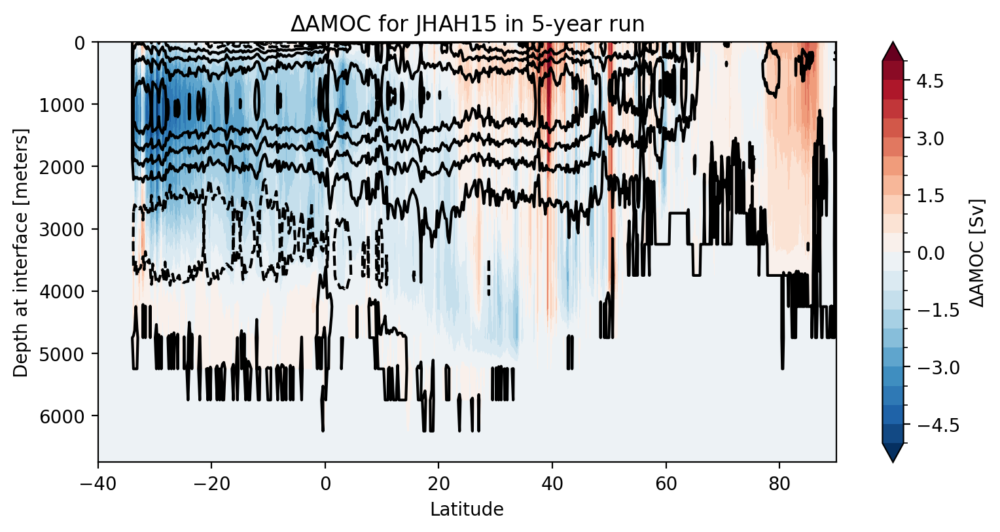

In [35]:
plt.figure(figsize=(8,4), dpi=200)
amoc_ctrl.sel(time=slice('1980','1982')).mean('time').plot.contour(levels=np.arange(-20,22,4), colors='k', linewidth=0.05)
(amoc_jh - amoc_ctrl).sel(time=slice('1980','1982')).mean('time').plot.contourf(levels=np.arange(-5,5.5,0.5), cbar_kwargs={'label': '$\Delta$AMOC [Sv]'})
plt.xlim([-40,None])
plt.gca().invert_yaxis()
plt.tight_layout()
plt.title('$\Delta$AMOC for JHAH15 in 5-year run')
plt.xlabel('Latitude')

# MLD in 5-years run

In [36]:
MLD_winter_ctrl = select_NA_Jenny(ds_short['unparameterized'].ocean_month.MLD_003.sel(time=slice('1980','1982')).groupby('time.month').mean('time').max('month')).compute()

In [37]:
MLD_winter_ann = select_NA_Jenny(ds_short['ANN-greenline'].ocean_month.MLD_003.sel(time=slice('1980','1982')).groupby('time.month').mean('time').max('month')).compute()

In [38]:
MLD_winter_jh = select_NA_Jenny(ds_short['JHAH15'].ocean_month.MLD_003.sel(time=slice('1980','1982')).groupby('time.month').mean('time').max('month')).compute()

Text(0.5, 1.0, '$\\Delta$MLD for ANN')

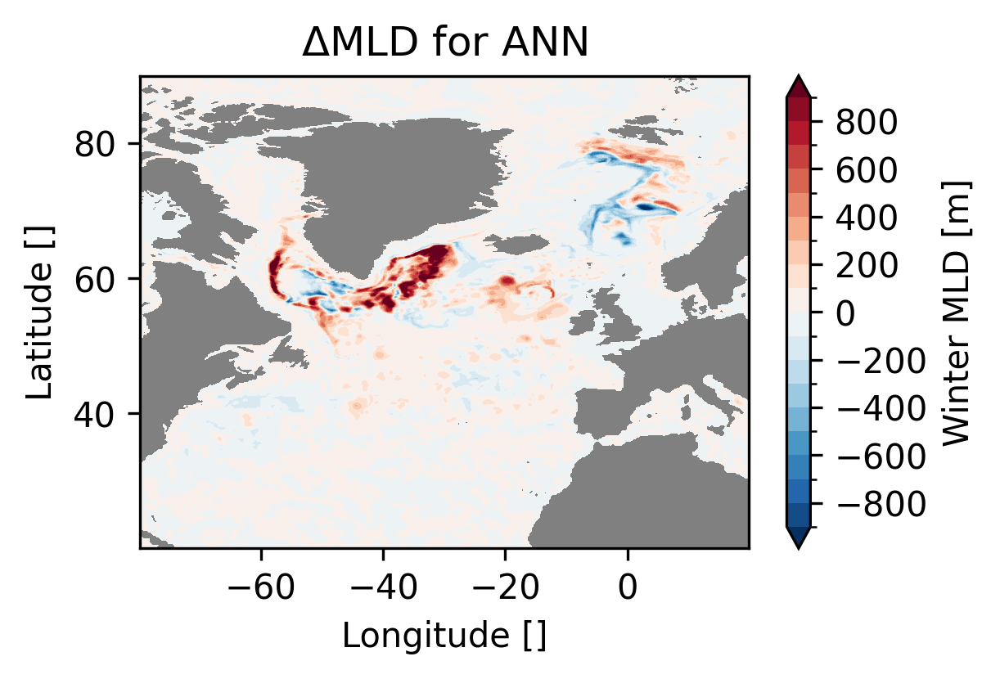

In [41]:
plt.figure(figsize=(4,2.5), dpi=300)
(MLD_winter_ann-MLD_winter_ctrl).plot.contourf(cbar_kwargs={'label': 'Winter MLD [m]'}, levels=np.arange(-900,950,100))
plt.gca().set_facecolor('gray')
plt.title('$\Delta$MLD for ANN')

Text(0.5, 1.0, '$\\Delta$MLD for JHAH15')

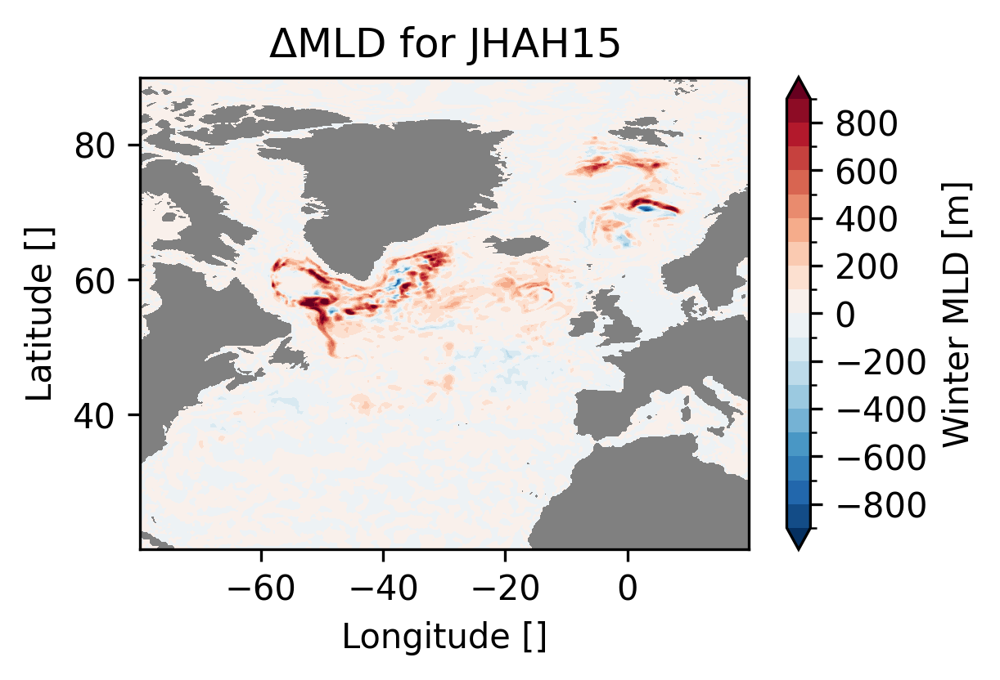

In [42]:
plt.figure(figsize=(4,2.5), dpi=300)
(MLD_winter_jh-MLD_winter_ctrl).plot.contourf(cbar_kwargs={'label': 'Winter MLD [m]'}, levels=np.arange(-900,950,100))
plt.gca().set_facecolor('gray')
plt.title('$\Delta$MLD for JHAH15')

# Check eddies in near Florida strait

In [2]:
ds = CollectionOfExperiments.init_folder('/scratch/js15017/OM4_storage/CORE-AIF-runs', additional_subfolder='', Averaging_time=slice('1981', '2007'))

In [5]:
ds_short = CollectionOfExperiments.init_folder('/scratch/pp2681/mom6/OM4_SIS2')

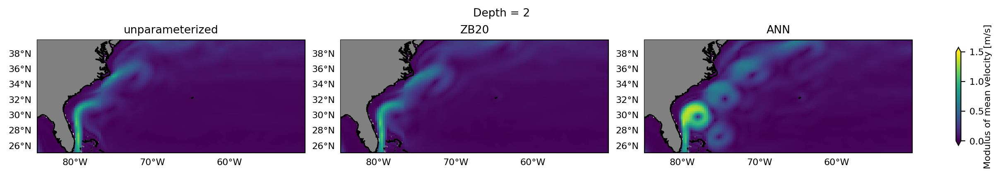

In [17]:
ds.plot_uabs(['unparameterized', 'ZB20', 'ANN'], select=select_NA_Florida, ncols=3, vmax=1.5)

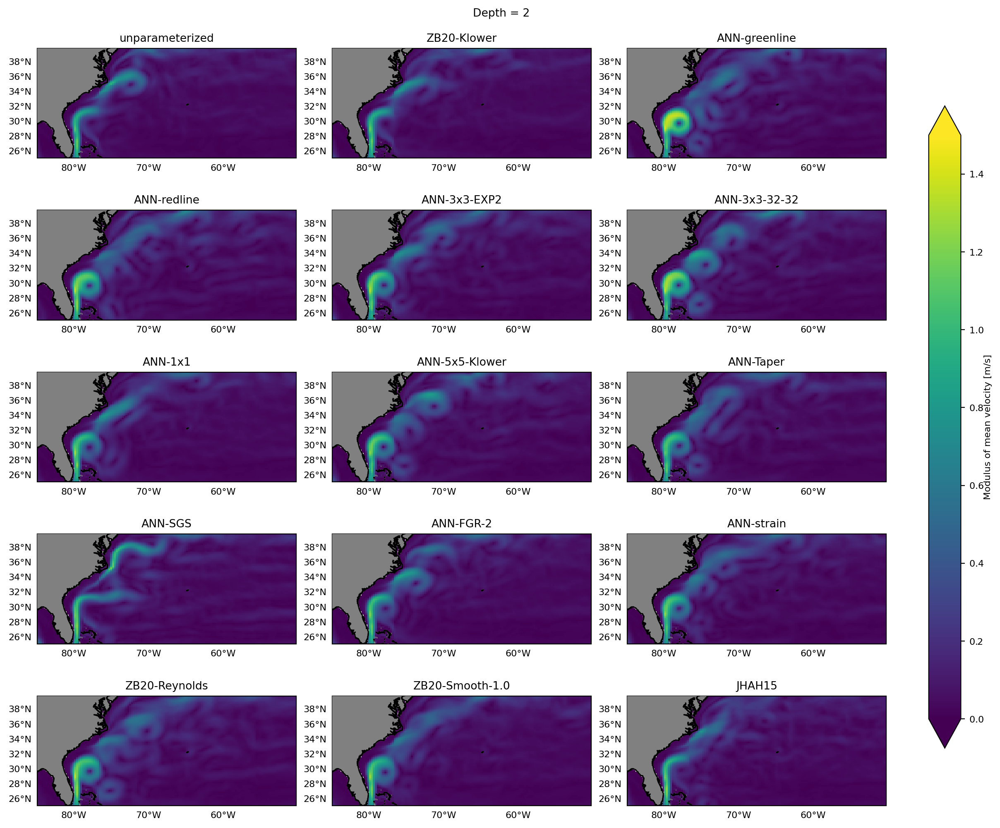

In [24]:
ds_short.plot_uabs(['unparameterized', 'ZB20-Klower', 'ANN-greenline', 'ANN-redline', 'ANN-3x3-EXP2', 'ANN-3x3-32-32', 'ANN-1x1', 'ANN-5x5-Klower', 'ANN-Taper', 'ANN-SGS', 'ANN-FGR-2', 'ANN-strain', 'ZB20-Reynolds', 'ZB20-Smooth-1.0', 'JHAH15'], select=select_NA_Florida, ncols=3, vmax=1.5)